Assignment-3: Model Interpretability

Name: Deepthi Nasika

NUID: 02474582

# AIM

The main aim of this assignment is to interpret different models

1. Fit a linear model and interpret the regression coefficients
2. Fit a tree based model and interpret the nodes
3. Use AutoML to find the best model

We also aim to perform SHAP analysis on all the above models. We try to interpret the model by different methods like SHAP values, LIME, Partial Dependence Plot and compare them


# MIT License

MIT License

Copyright (c) 2024 Deepthi-Nasika

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.

# Varaiable Description

The dataset contains information about a global superstore which include various attributes related to sales transactions, customer orders, and shipping details. The dataset contains both numeric and categorical variables.

Here is the description of columns present in the dataset:

1. category: The category of products sold in the superstore.
2. city: The city where the order was placed.
3. country: The country in which the superstore is located.
4. customer_id: A unique identifier for each customer.
5. customer_name: The name of the customer who placed the order.
6. discount: The discount applied to the order.
7. market: The market or region where the superstore operates.
8. order_date: The date when the order was placed.
9. order_id: A unique identifier for each order.
10. order_priority: The priority level of the order.
11. product_id: A unique identifier for each product.
12. product_name: The name of the product.
13. profit: The profit generated from the order.
14. quantity: The quantity of products ordered.
15. region: The region where the order was placed.
16. row_id: A unique identifier for each row in the dataset.
17. sales: The total sales amount for the order.
18. segment: The customer segment (e.g., consumer, corporate, or home office).
19. ship_date: The date when the order was shipped.
20. ship_mode: The shipping mode used for the order.
21. shipping_cost: The cost of shipping for the order.
22. state: The state or region within the country.
23. sub_category: The sub-category of products within the main category.
24. year: The year in which the order was placed.
25. market2: Another column related to market information.
26. weeknum: The week number when the order was placed.

# Importing Libraries and Data

In [1]:
# Importing required libraries
!pip install shap
!pip install lime
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o
!pip install pydot
!pip install --upgrade scikit-learn
!pip install scipy
!pip3 install -U scikit-learn scipy matplotlib
!pip install -U scikit-learn --user

In [2]:
import pandas as pd
import numpy as np
import shap
import lime
from lime import lime_tabular
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.ensemble import HistGradientBoostingRegressor
import random
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import pydot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns

plt.rcParams["figure.figsize"] = (32, 24)

In [4]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

In [5]:
# Setting up memory
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

6


In [6]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:6771..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpjeraud64
  JVM stdout: /tmp/tmpjeraud64/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpjeraud64/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:6771
Connecting to H2O server at http://127.0.0.1:6771 ... successful.


H2O_cluster_uptime:,05 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,4 days
H2O_cluster_name:,H2O_from_python_unknownUser_3b9jtx
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,6 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [7]:
url = "https://raw.githubusercontent.com/Deepthi-Nasika/DSEMT_Assignments/main/Data/dataset_superstore.csv"
encoded_url = "https://raw.githubusercontent.com/Deepthi-Nasika/DSEMT_Assignments_002474582/main/Data/dataset_superstore_encoded.csv"

raw_data = pd.read_csv(url)
data = pd.read_csv(encoded_url)

In [8]:
data.head()

,Category,City,Country,Customer.ID,Customer.Name,Discount,Market,Order.Date,Order.ID,Order.Priority,...,Sales,Segment,Ship.Date,Ship.Mode,Shipping.Cost,State,Sub.Category,Year,Market2,weeknum
0,1,1910,139,2909,481,0,6,281,722,1,...,19,0,388,2,4,192,12,2011,5,2
1,1,1910,139,3341,498,0,6,939,920,3,...,19,0,1203,3,0,192,12,2011,5,4
2,1,1910,139,1057,141,0,6,213,572,3,...,21,0,416,3,1,192,12,2011,5,32
3,1,1910,139,1057,141,0,6,213,572,3,...,111,0,416,3,4,192,12,2011,5,32
4,1,1910,139,277,60,0,6,1342,905,1,...,6,0,133,3,1,192,12,2011,5,40


In [9]:
X = data.drop(columns = ['Profit'])
y = data['Profit']

In [10]:
# Splitting Data into Training and Test
(x_train, x_test, y_train, y_test) = train_test_split(X, y, test_size=0.1, random_state=42)

# Taking 100 samples out for SHAP analysis as it is a computationally expensive process
x_train_100 = shap.utils.sample(x_train, 100)
x_test_100 = shap.utils.sample(x_test, 100)

In [11]:
model = HistGradientBoostingRegressor()
model.fit(x_train, y_train)

HistGradientBoostingRegressor()

# Fitting a Linear Model

In [12]:
# Initializing a linear model
linear_model = sklearn.linear_model.LinearRegression()
# Training linear model
linear_model.fit(x_train, y_train)

LinearRegression()

In [13]:
# Scaling the data using Min-Max scaling for the purpose of evaluating Co-efficients, as non scaled data may mislead while we evaluate the co-efficients
df = data.drop('Profit', axis=1)
df_norm = (df - df.min()) / (df.max() - df.min())
df_norm = pd.concat((df_norm, data.Profit), 1)

<ipython-input-13-36556217009c>:4: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  df_norm = pd.concat((df_norm, data.Profit), 1)


In [14]:
df_norm.head()

,Category,City,Country,Customer.ID,Customer.Name,Discount,Market,Order.Date,Order.ID,Order.Priority,...,Segment,Ship.Date,Ship.Mode,Shipping.Cost,State,Sub.Category,Year,Market2,weeknum,Profit
0,0.5,0.525447,0.952055,0.597085,0.605793,NaN,1.0,0.196641,0.028841,0.333333,...,0.0,0.265208,0.666667,0.004287,0.175663,0.75,0.0,1.0,0.019231,9
1,0.5,0.525447,0.952055,0.685755,0.627204,NaN,1.0,0.657103,0.036750,1.000000,...,0.0,0.822283,1.000000,0.000000,0.175663,0.75,0.0,1.0,0.057692,9
2,0.5,0.525447,0.952055,0.216954,0.177582,NaN,1.0,0.149055,0.022849,1.000000,...,0.0,0.284347,1.000000,0.001072,0.175663,0.75,0.0,1.0,0.596154,9
3,0.5,0.525447,0.952055,0.216954,0.177582,NaN,1.0,0.149055,0.022849,1.000000,...,0.0,0.284347,1.000000,0.004287,0.175663,0.75,0.0,1.0,0.596154,53
4,0.5,0.525447,0.952055,0.056856,0.075567,NaN,1.0,0.939118,0.036151,0.333333,...,0.0,0.090909,1.000000,0.001072,0.175663,0.75,0.0,1.0,0.750000,3


In [15]:
df_norm.columns = df_norm.columns.str.replace('.', '_')

<ipython-input-15-c2082ef7ee34>:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_norm.columns = df_norm.columns.str.replace('.', '_')


# Interpreting Regression Coefficients

In [16]:
import statsmodels.formula.api as smf
# Assuming dfpd is the correct DataFrame and all columns are appropriately named
results = smf.ols('Profit ~ City + Country + Order_Date + Order_ID + Order_Priority + Product_Name + Quantity + Region + Row_ID + Sales + Segment + Ship_Date	+ Ship_Mode	+ Shipping_Cost + State + Sub_Category + Market2 + weeknum', data=df_norm).fit()
results_summary = results.summary()
print(results_summary)

                            OLS Regression Results                            
Dep. Variable:                 Profit   R-squared:                       0.248
Model:                            OLS   Adj. R-squared:                  0.247
Method:                 Least Squares   F-statistic:                     938.2
Date:                Sun, 17 Mar 2024   Prob (F-statistic):               0.00
Time:                        23:54:42   Log-Likelihood:            -3.3014e+05
No. Observations:               51290   AIC:                         6.603e+05
Df Residuals:                   51271   BIC:                         6.605e+05
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         36.8241      4.604      7.

Linear model has very limited predicting capability as R-square value is 0.248. It only explains 24.8% of variance in 'Profit'. Independent variables like 'Sales', 'Shipping Cost' has significant impact in predicting the target variable 'Profit' as indicated by the p-values.

# Fit Tree Based Model

In [17]:
# Setting the max_dept to 3 for the purpose of ease of explainbility and readability
tree_model = RandomForestRegressor(max_depth=3, random_state=0, n_estimators=10)
tree_model.fit(x_train, y_train)

RandomForestRegressor(max_depth=3, n_estimators=10, random_state=0)

# Interpreting Nodes of a tree based model

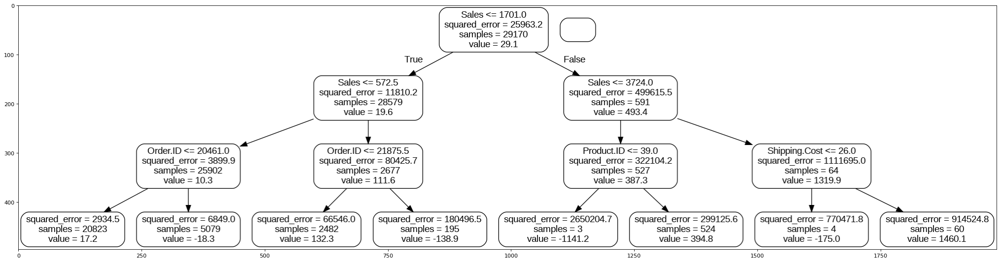

In [18]:
# Visualization of Nodes
figure(figsize=(32, 24), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(x_train.columns),
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

The decision tree from the model reveals that 'Order ID' and 'Sales' are the independent variables that has strong influence on the model's predictions. Further split which is based on 'Product ID' and 'Shipping Cost' also contribute significantly to the variance in the data.

In [19]:
# Get numerical feature importances
tree_importances = list(tree_model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(x_train.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

In [20]:
# Print out the feature and importances
[print("Variable: {:20} Importance: {}".format(*pair)) for pair in feature_importances];

Variable: Sales                Importance: 0.87
Variable: Order.ID             Importance: 0.06
Variable: Sub.Category         Importance: 0.04
Variable: Order.Date           Importance: 0.02
Variable: Shipping.Cost        Importance: 0.01
Variable: Category             Importance: 0.0
Variable: City                 Importance: 0.0
Variable: Country              Importance: 0.0
Variable: Customer.ID          Importance: 0.0
Variable: Customer.Name        Importance: 0.0
Variable: Discount             Importance: 0.0
Variable: Market               Importance: 0.0
Variable: Order.Priority       Importance: 0.0
Variable: Product.ID           Importance: 0.0
Variable: Product.Name         Importance: 0.0
Variable: Quantity             Importance: 0.0
Variable: Region               Importance: 0.0
Variable: Row.ID               Importance: 0.0
Variable: Segment              Importance: 0.0
Variable: Ship.Date            Importance: 0.0
Variable: Ship.Mode            Importance: 0.0
Variable

Variables which has the most importance are:


*   Variable: Sales, Importance: 0.87
*   Variable: Order.ID, Importance: 0.06
*   Variable: Sub.Category, Importance: 0.04
*   Variable: Order.Date, Importance: 0.02
*   Variable: Shipping.Cost, Importance: 0.01

The above independent variables can be considered as features in predicting the target variable 'Profit' based on the trained tree based model.

# AutoML to find best model

In [21]:
# Converting Pandas dataframe in H2O dataframe
data_hf = h2o.H2OFrame(data)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [22]:
# Split into training and test dataset.
pct_rows = 0.80
df_train, df_test = data_hf.split_frame([pct_rows])

In [23]:
# Setting up AutoML
def autoML(df_train, df_test):
    X = df_train.columns
    y = "Profit"

    X.remove(y)  # Removing the result frm our predictors data

    aml = H2OAutoML(max_runtime_secs=222, seed=1)  # Setting of AutoML
    aml.train(
        x=X, y=y, training_frame=df_train
    )  # Trainig the dataset on different models

    return df_train, df_test, aml


# Function to get best model from the AutoML leaderboard
def getBestModel(aml):
    model_index = 0
    glm_index = 0
    glm_model = ""
    aml_leaderboard_df = aml.leaderboard.as_data_frame()
    models_dict = {}

    for m in aml_leaderboard_df["model_id"]:
        models_dict[m] = model_index
        if "StackedEnsemble" not in m:
            break
        model_index = model_index + 1

    for m in aml_leaderboard_df["model_id"]:
        if "GLM" in m:
            models_dict[m] = glm_index
            break
        glm_index = glm_index + 1

    print(model_index)
    best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])
    return best_model

In [24]:
# Training AutoML
autoML = autoML(df_train, df_test)

AutoML progress: |
23:55:27.573: _train param, Dropping bad and constant columns: [Discount]

███
23:55:35.924: _train param, Dropping bad and constant columns: [Discount]
23:55:37.478: _train param, Dropping bad and constant columns: [Discount]

████
23:55:50.513: _train param, Dropping unused columns: [Discount]


23:55:52.413: _train param, Dropping bad and constant columns: [Discount]

██
23:55:58.652: _train param, Dropping bad and constant columns: [Discount]

████████
23:56:25.118: _train param, Dropping bad and constant columns: [Discount]

█
23:56:30.212: _train param, Dropping bad and constant columns: [Discount]

██
23:56:35.771: _train param, Dropping bad and constant columns: [Discount]

█
23:56:40.323: _train param, Dropping unused columns: [Discount]


23:56:42.517: _train param, Dropping unused columns: [Discount]

█
23:56:44.974: _train param, Dropping bad and constant columns: [Discount]

██
23:56:50.194: _train param, Dropping bad and constant columns: [Discount]

██

In [25]:
# Leaderbord of AutoML output
autoML[2].leaderboard

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_BestOfFamily_4_AutoML_1_20240317_235526,102.78,10563.7,40.9761,nan,10563.7
StackedEnsemble_AllModels_3_AutoML_1_20240317_235526,102.837,10575.4,41.9721,nan,10575.4
StackedEnsemble_AllModels_2_AutoML_1_20240317_235526,104.365,10892,42.1711,nan,10892
XGBoost_grid_1_AutoML_1_20240317_235526_model_2,104.595,10940.2,42.4673,nan,10940.2
GBM_grid_1_AutoML_1_20240317_235526_model_5,104.843,10992,41.5581,nan,10992
GBM_3_AutoML_1_20240317_235526,104.99,11022.8,43.7384,nan,11022.8
StackedEnsemble_BestOfFamily_2_AutoML_1_20240317_235526,105.028,11031,42.3067,nan,11031
StackedEnsemble_BestOfFamily_3_AutoML_1_20240317_235526,105.046,11034.7,42.2324,nan,11034.7
StackedEnsemble_AllModels_1_AutoML_1_20240317_235526,105.213,11069.8,42.2304,nan,11069.8
GBM_5_AutoML_1_20240317_235526,105.685,11169.3,44.1837,nan,11169.3


In [26]:
# Getting Best Model
autoML_model = getBestModel(autoML[2])
print(autoML_model)

/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


3
Model Details
H2OXGBoostEstimator : XGBoost
Model Key: XGBoost_grid_1_AutoML_1_20240317_235526_model_2


Model Summary: 
    number_of_trees
--  -----------------
    35

ModelMetricsRegression: xgboost
** Reported on train data. **

MSE: 1751.2824275410298
RMSE: 41.84832646045753
MAE: 15.391515513301162
RMSLE: NaN
Mean Residual Deviance: 1751.2824275410298

ModelMetricsRegression: xgboost
** Reported on validation data. **

MSE: 10940.16037561135
RMSE: 104.59522157159643
MAE: 42.46729498943886
RMSLE: NaN
Mean Residual Deviance: 10940.16037561135

Scoring History: 
    timestamp            duration    number_of_trees    training_rmse    training_mae    training_deviance    validation_rmse    validation_mae    validation_deviance
--  -------------------  ----------  -----------------  ---------------  --------------  -------------------  -----------------  ----------------  ---------------------
    2024-03-17 23:57:33  3.579 sec   0                  181.462          63.9503         3

The best model is an H2O Gradient Boosting Machine (GBM) with 120 trees, all at a maximum depth of 4. The most important feature in predicting the target variable is 'Sales', 'Shipping Cost', 'Order.ID', 'Sub.Category', and 'Quantity'. These features are the most influential for the model's predictions.

# SHAP, Partial Dependence Plot, Individual Conditional Expectation Analysis for AutoML Best Model

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

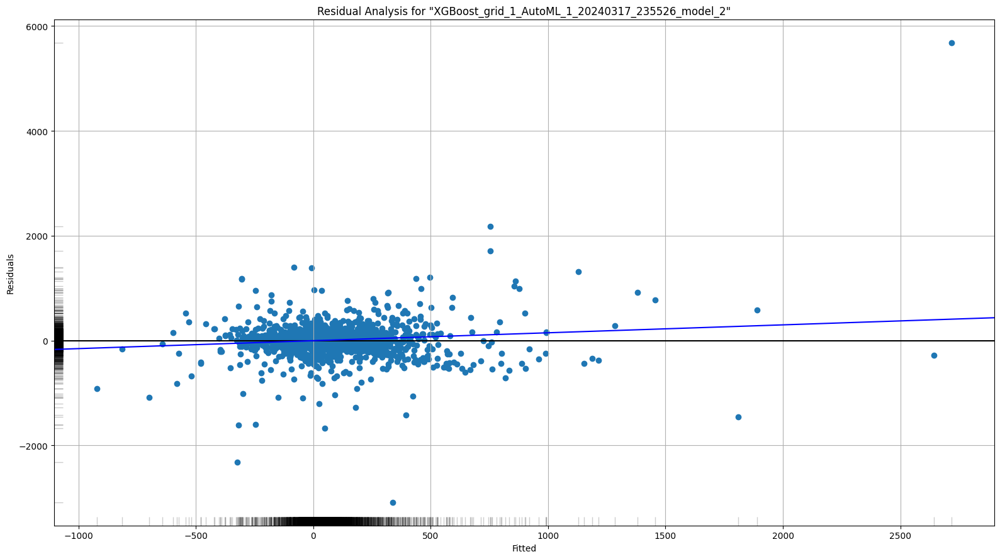

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

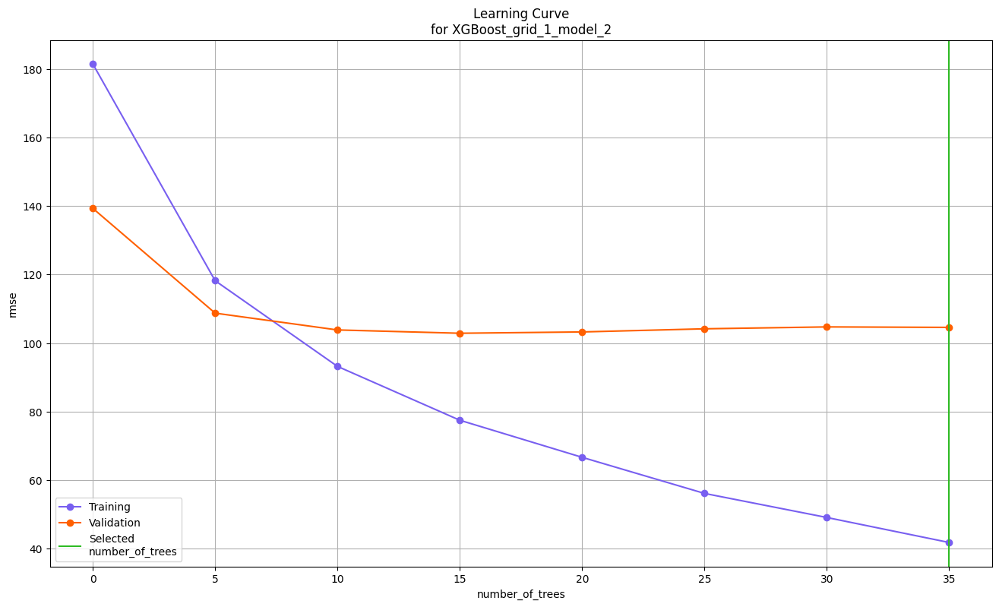

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

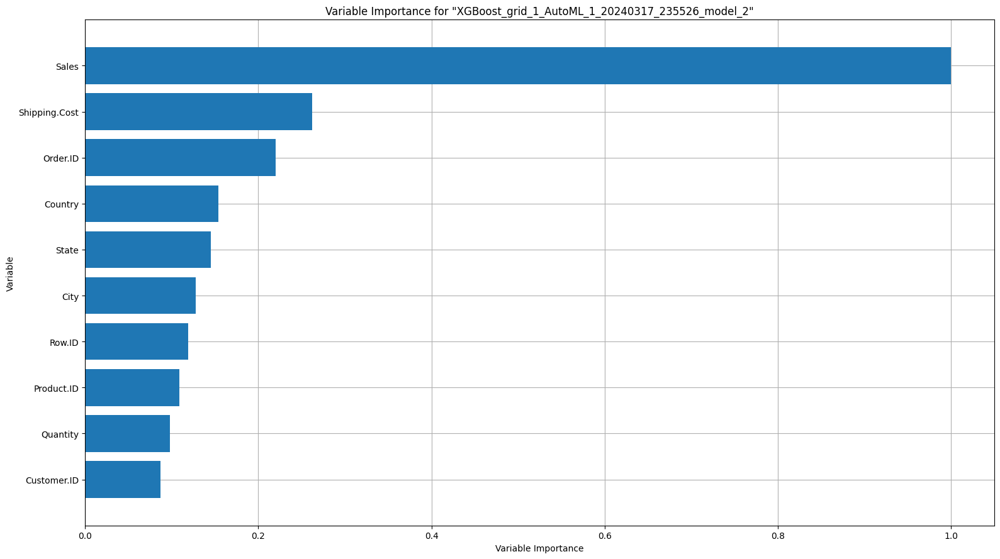

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

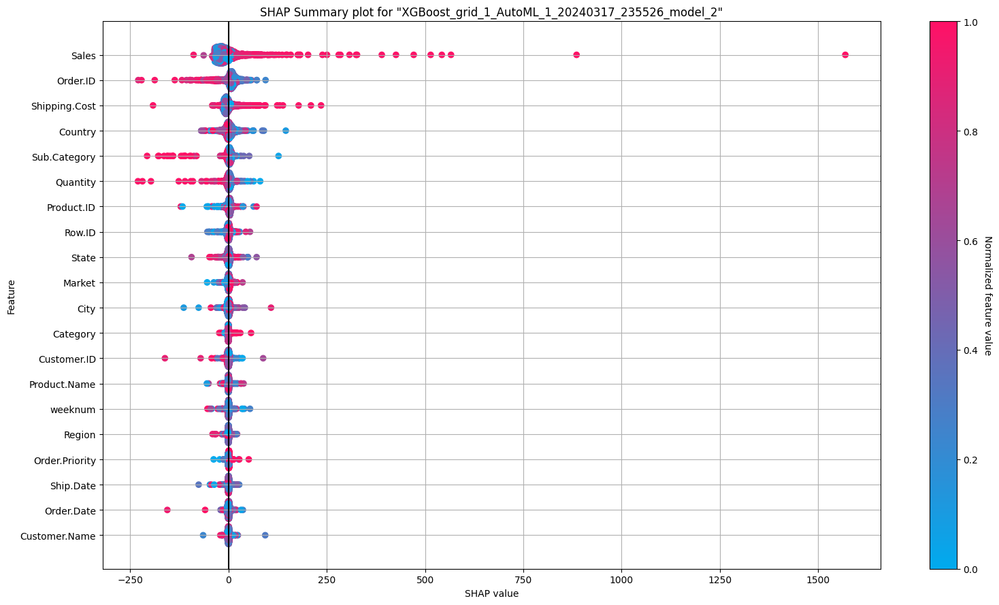

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

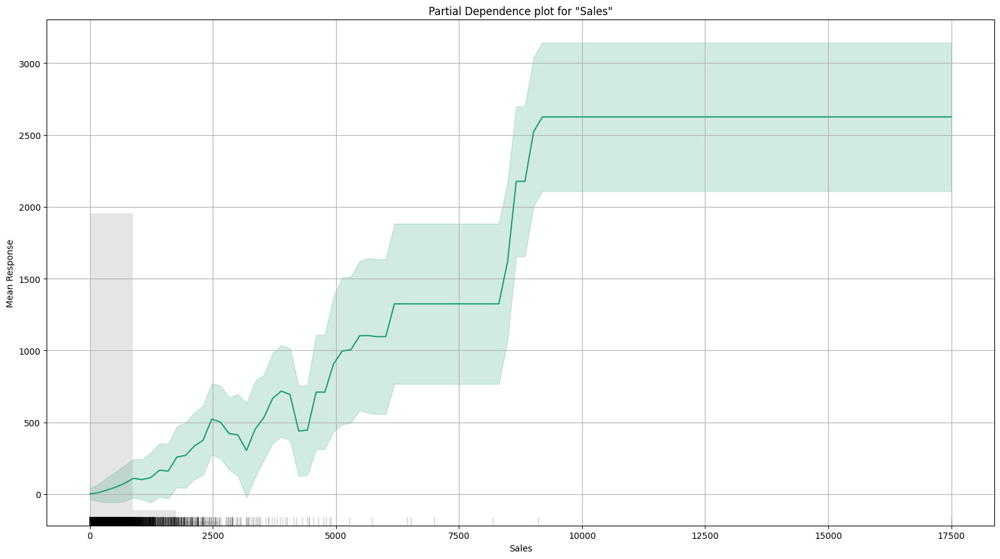

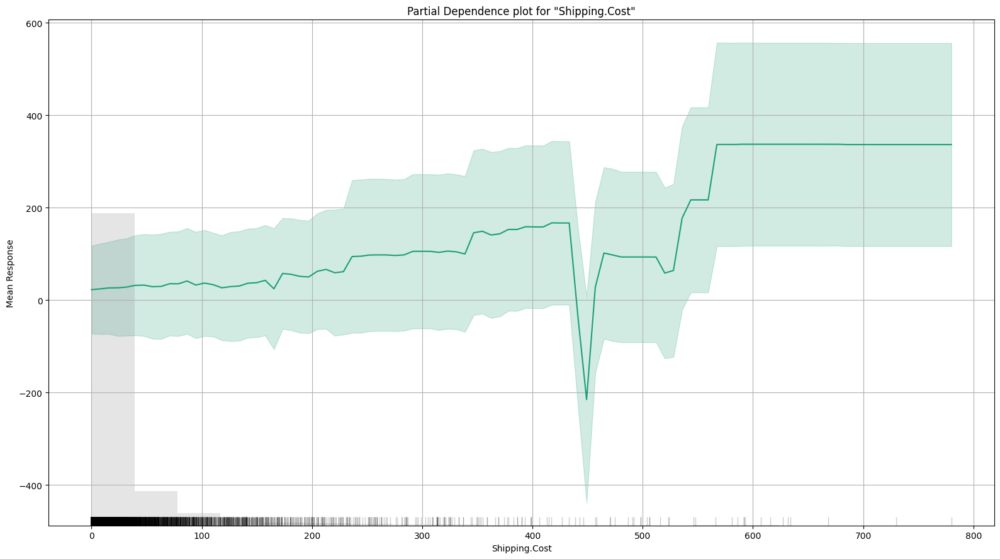

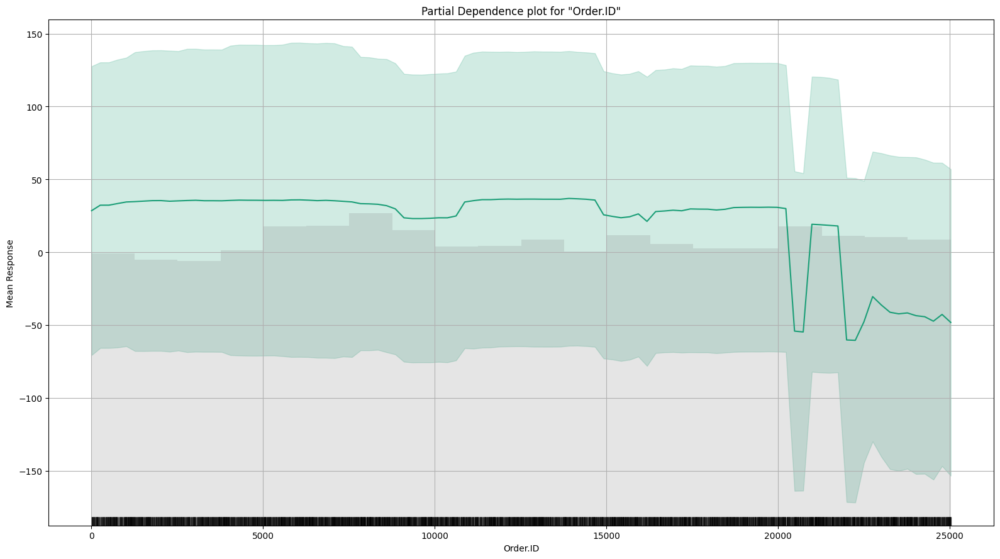

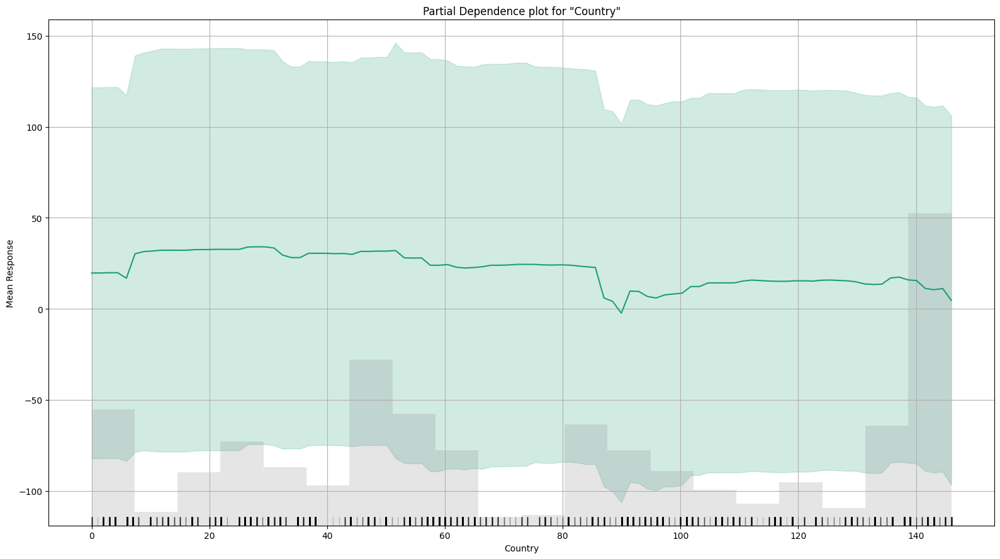

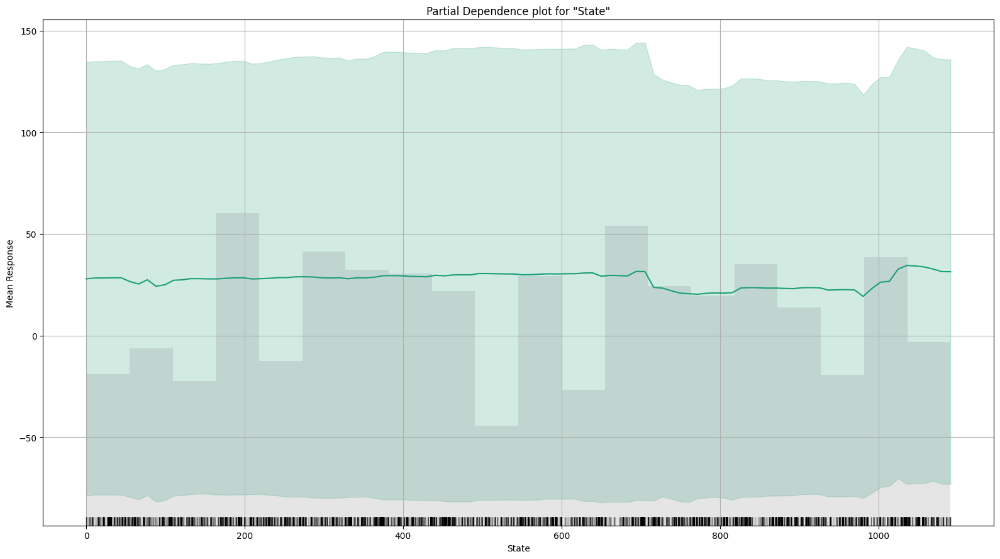

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

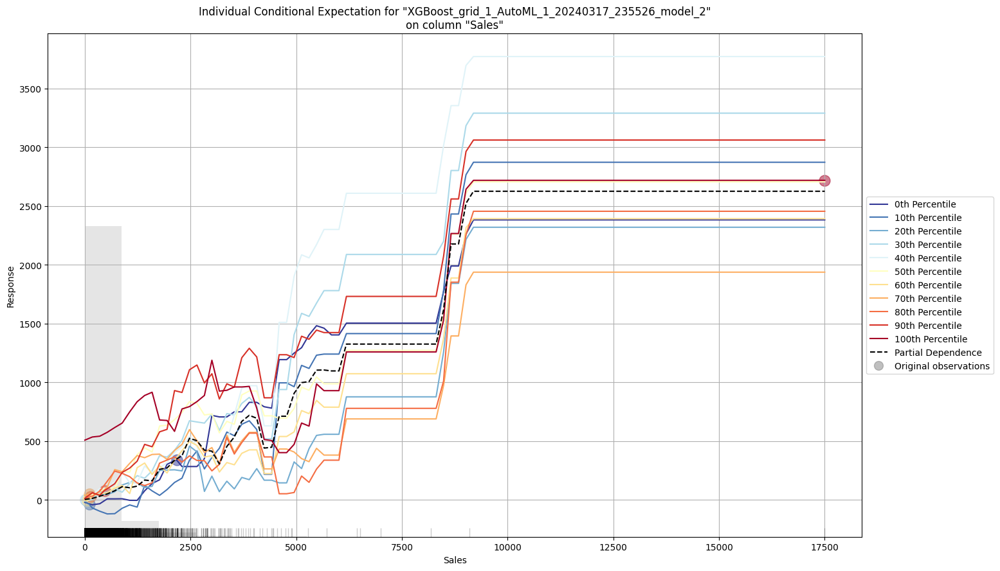

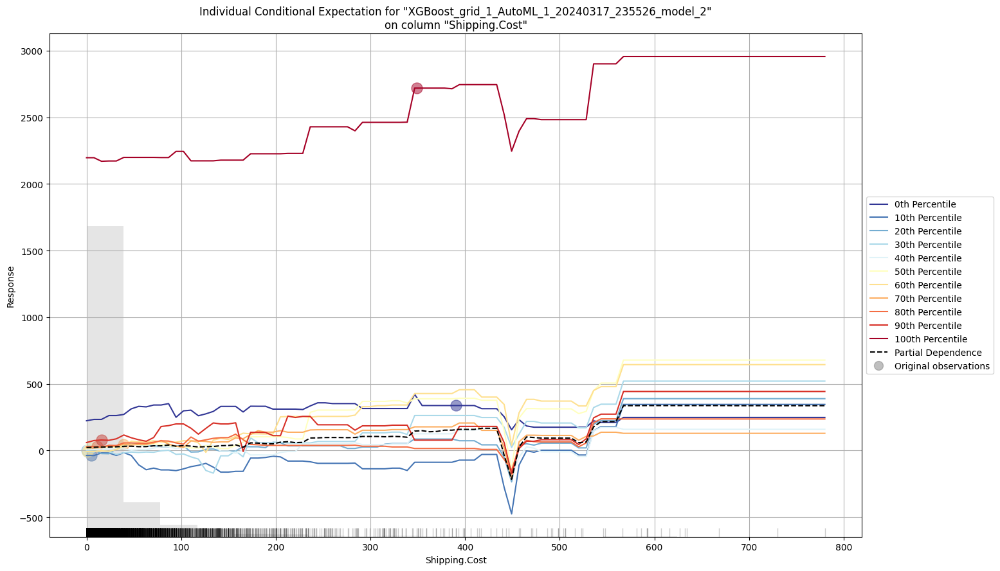

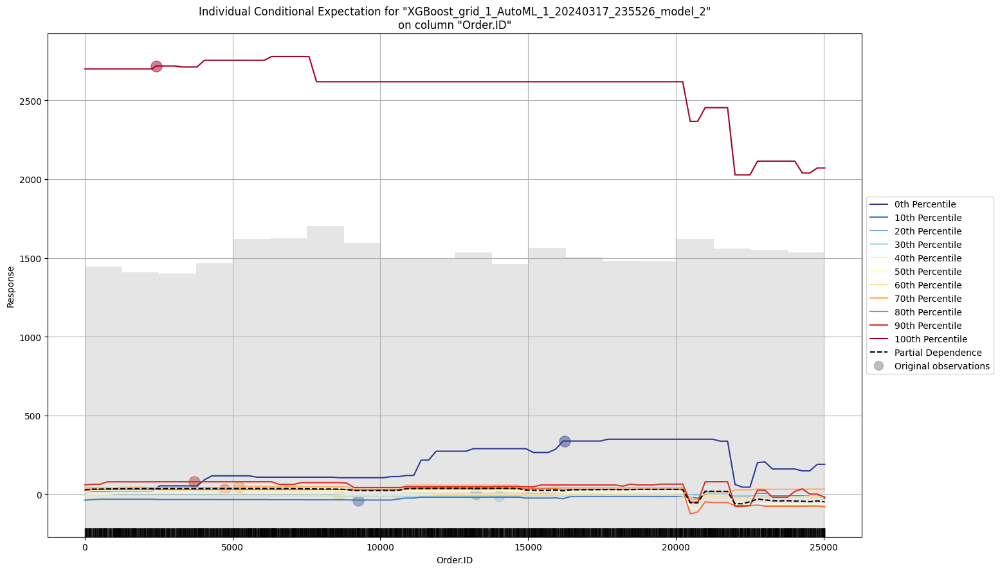

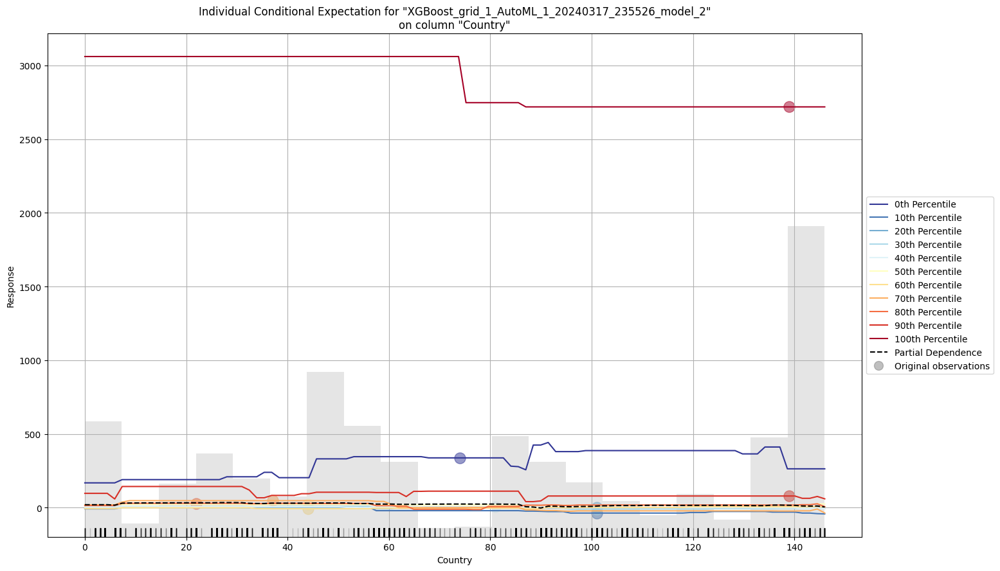

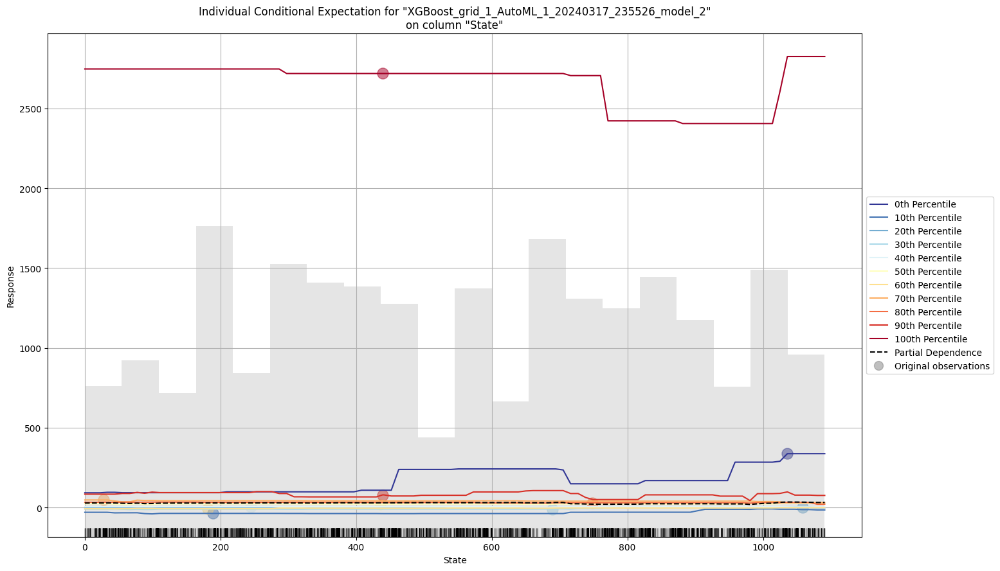

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

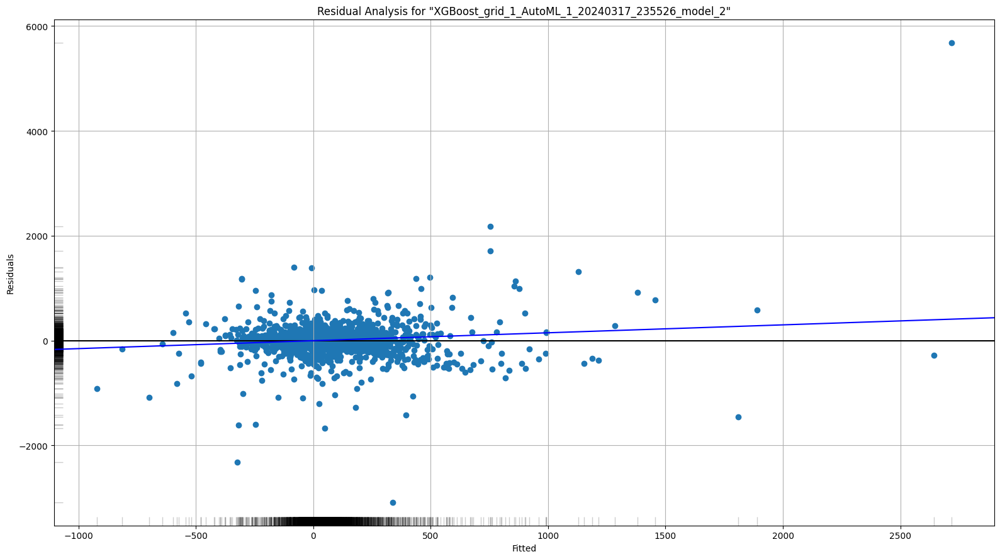

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

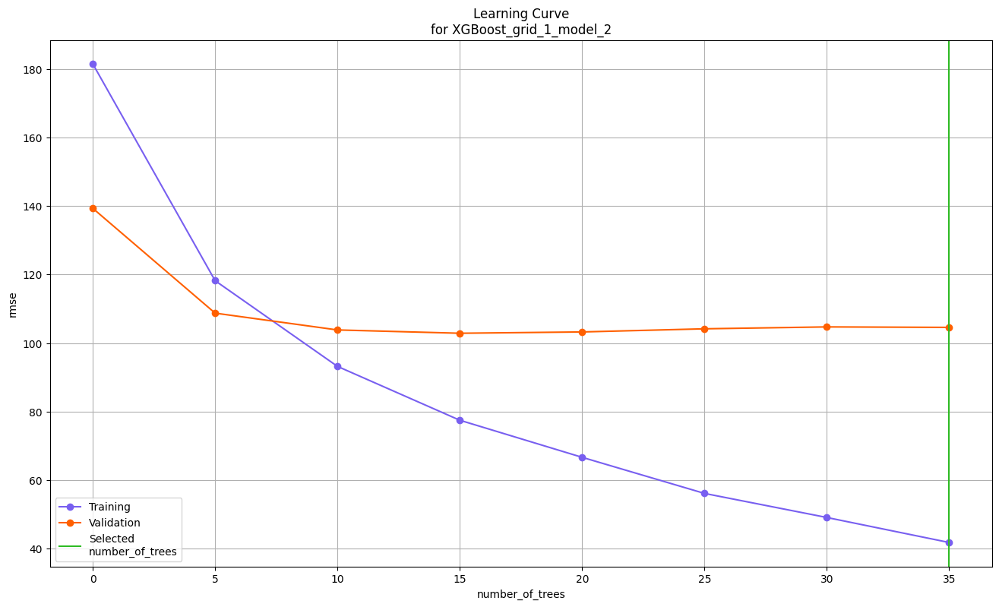

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

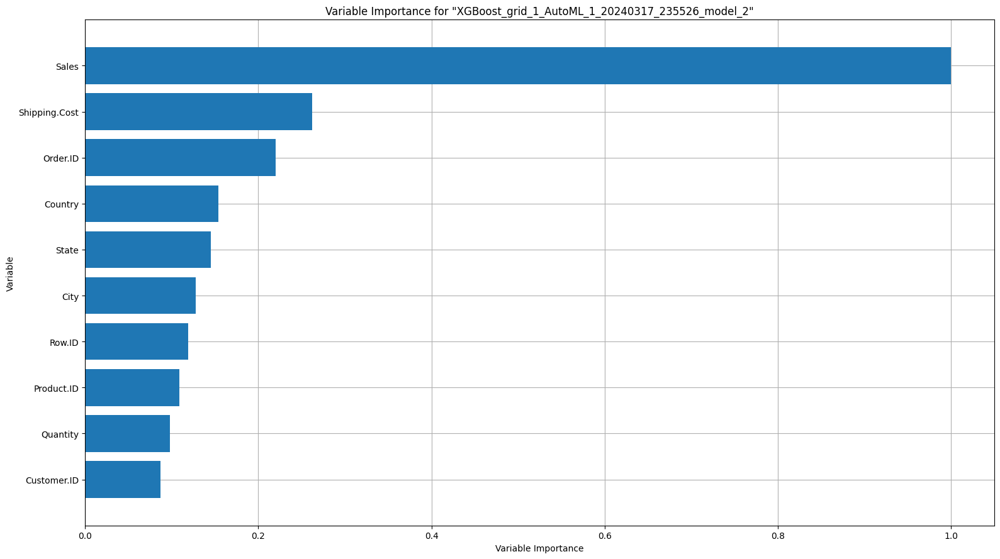

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

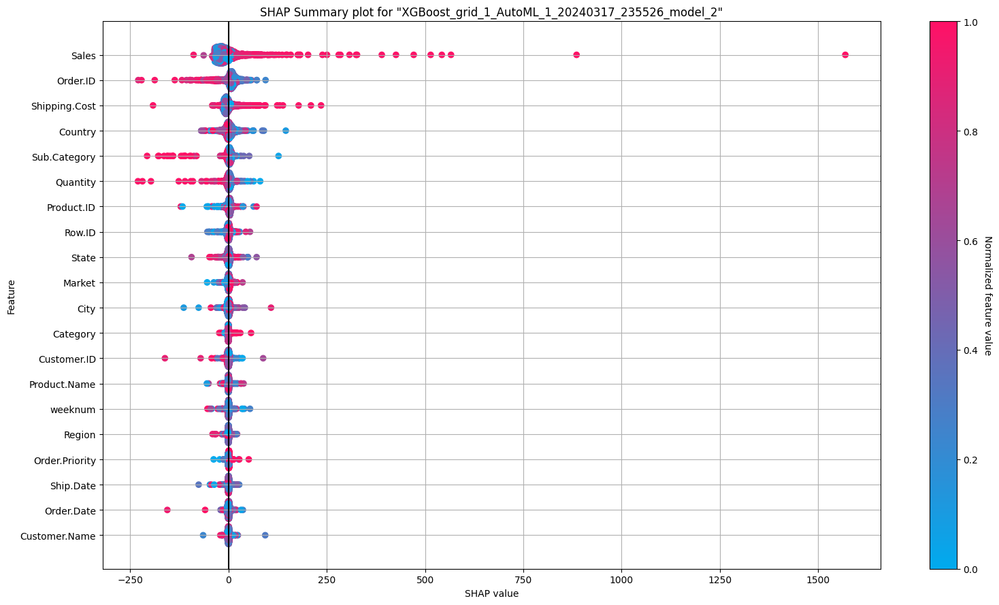

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

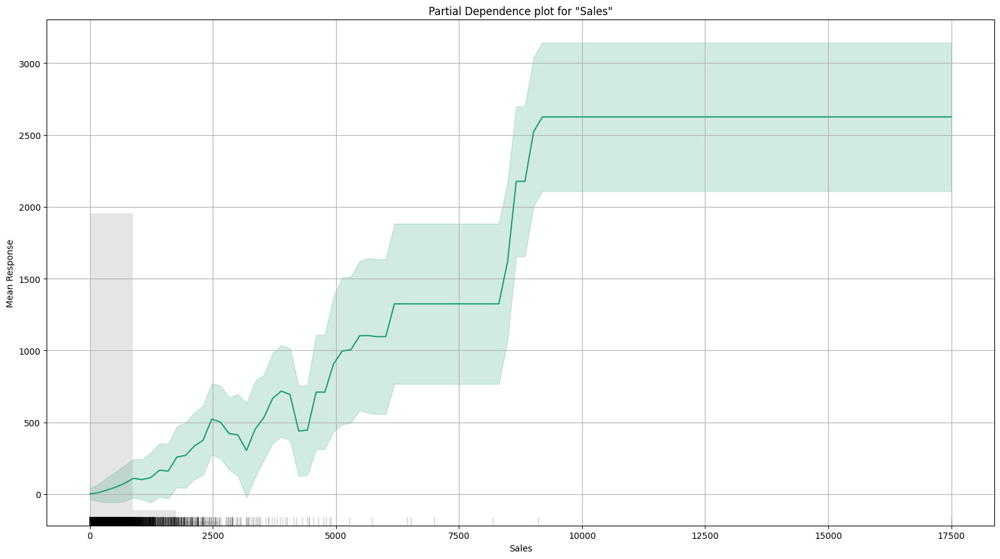

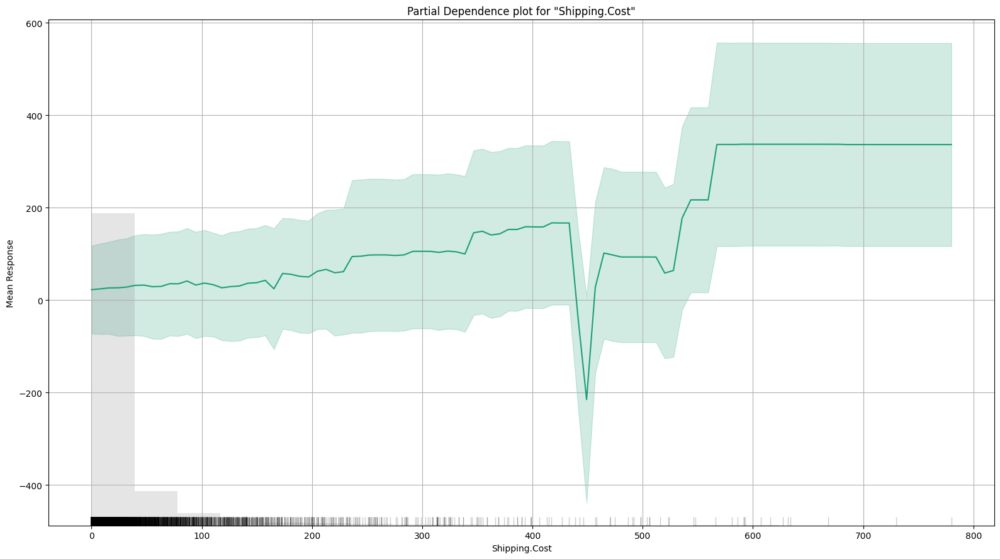

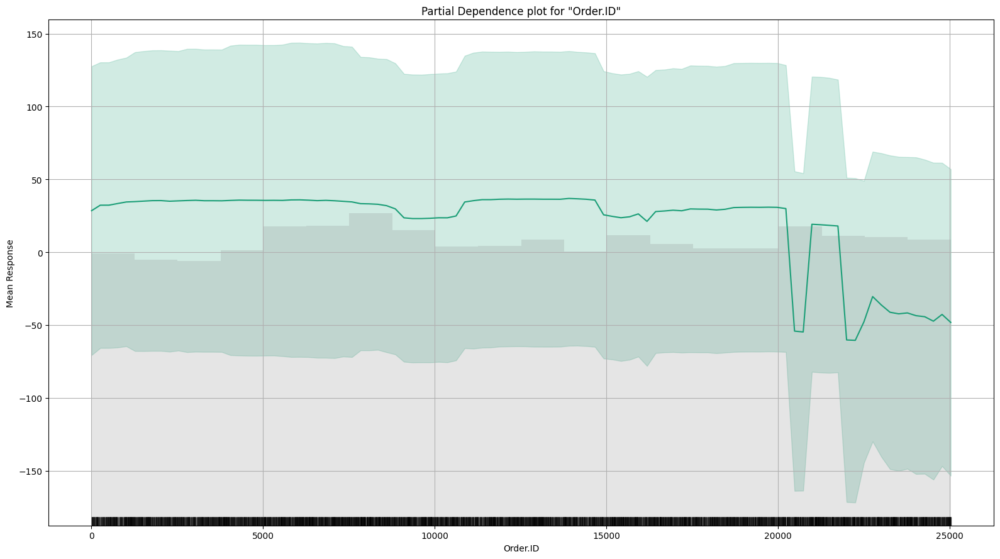

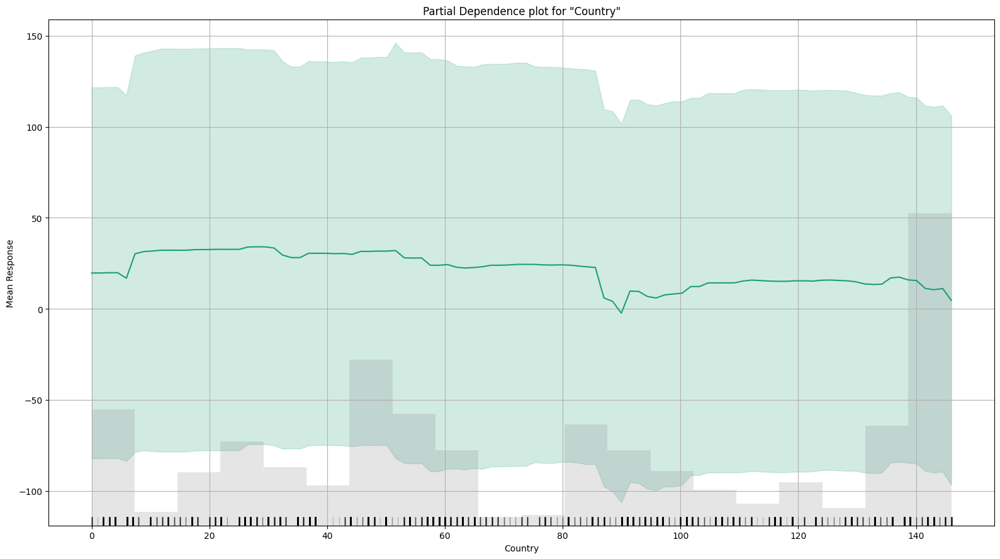

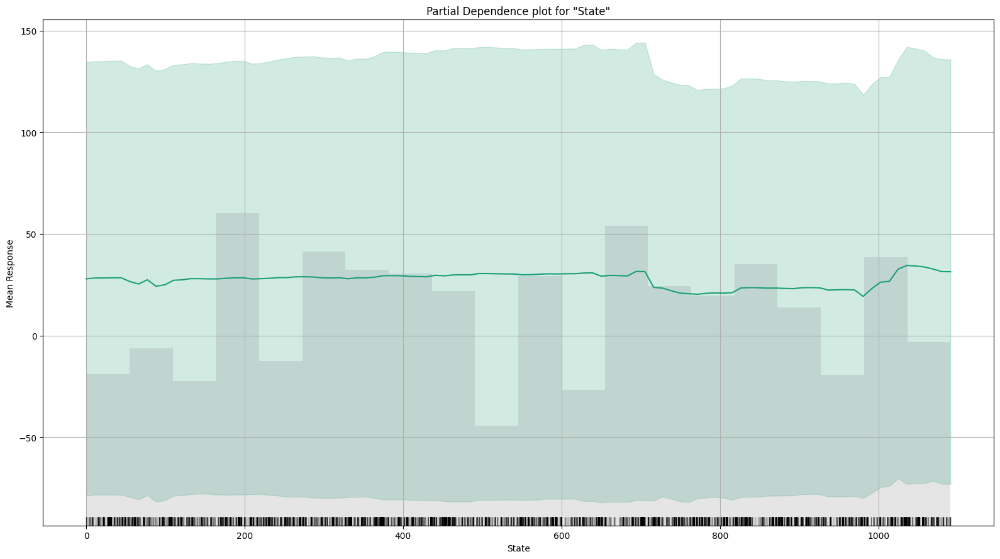

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

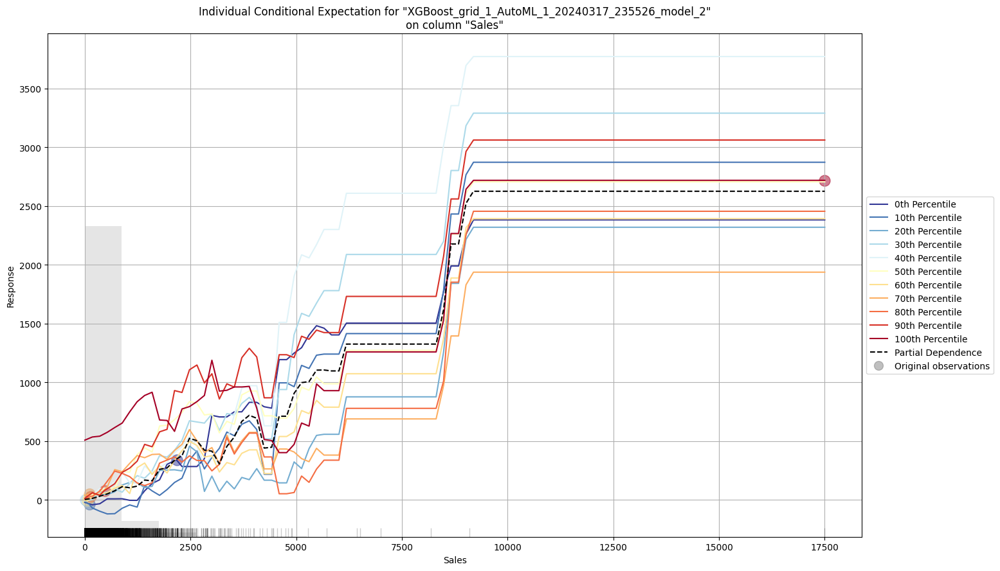

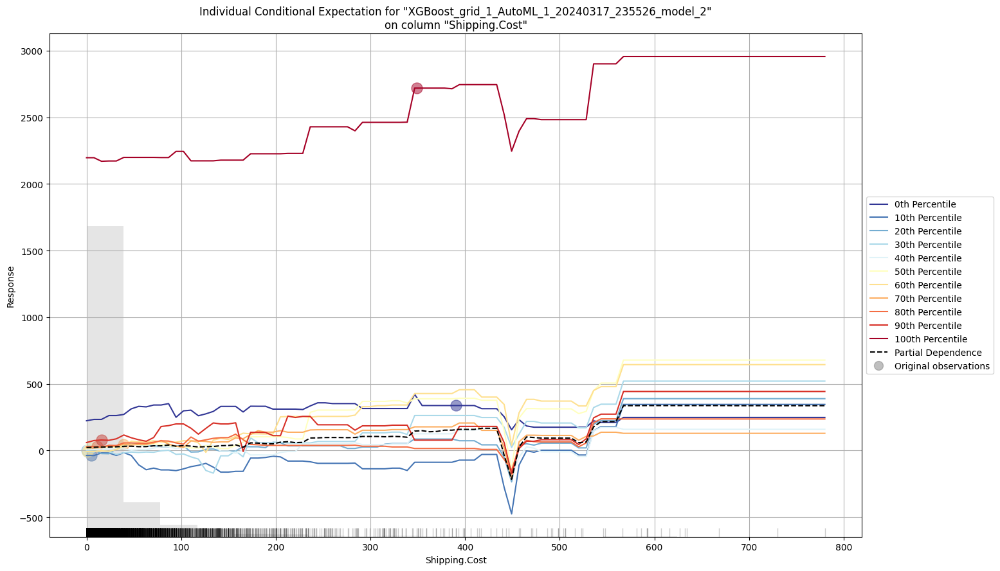

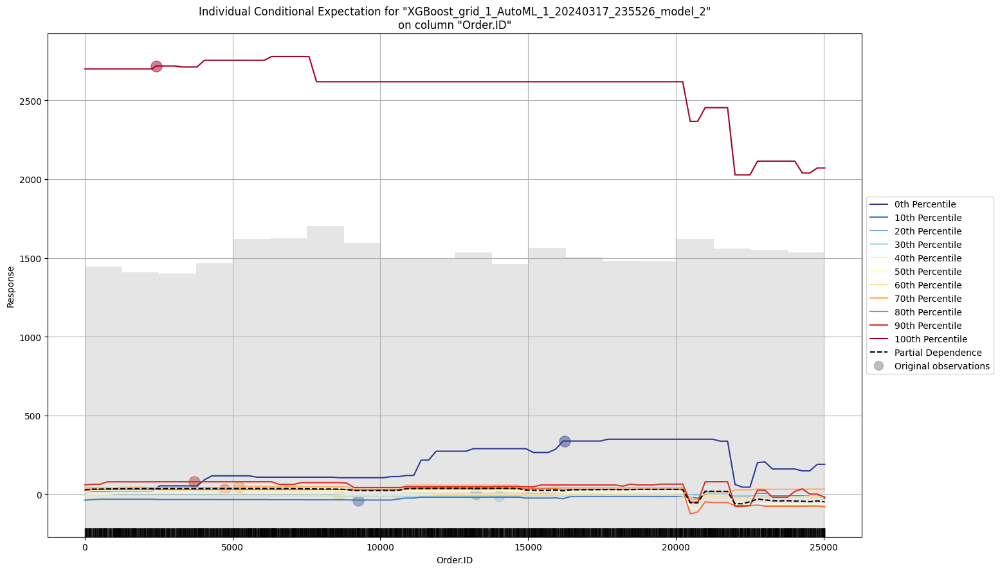

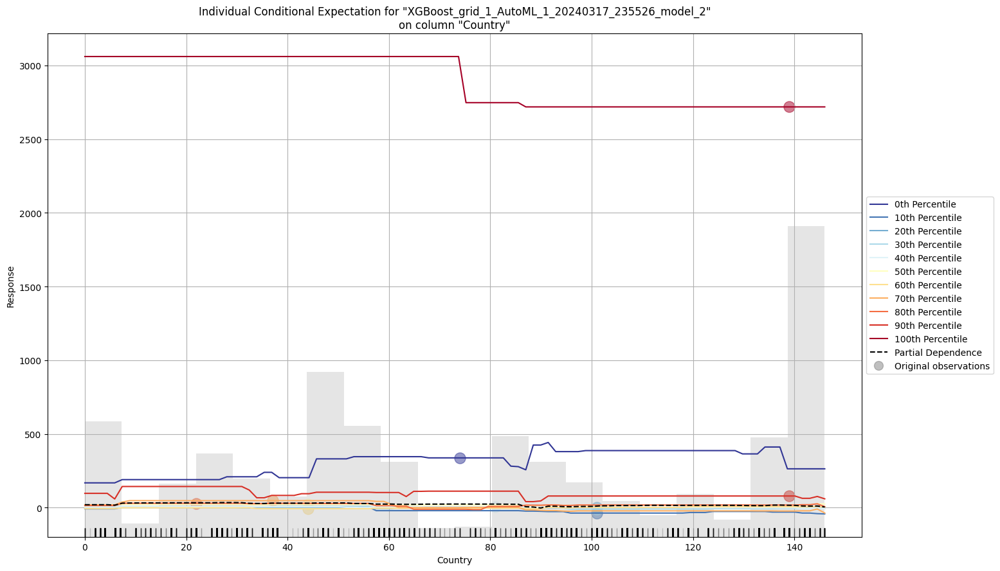

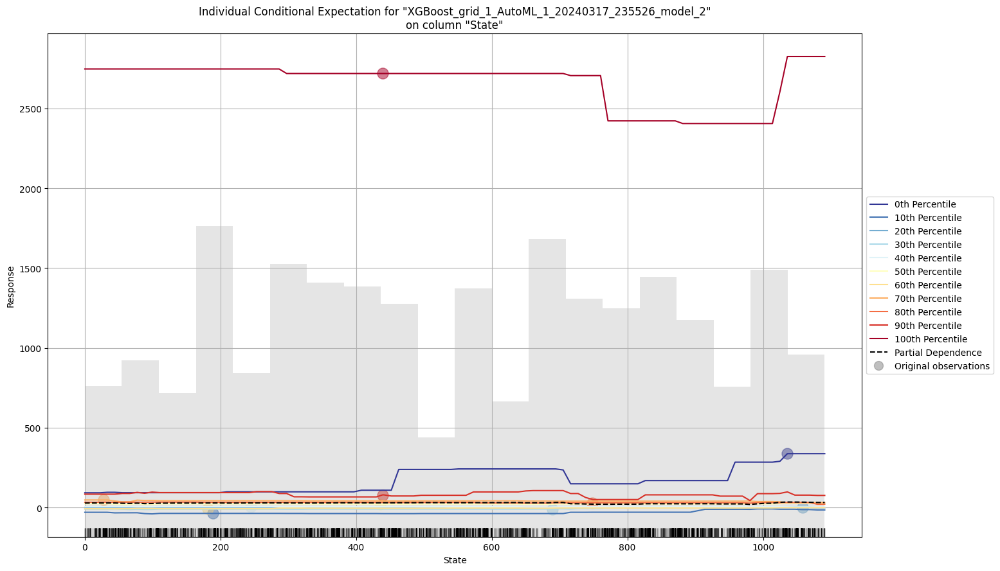

In [27]:
# AutoML Explainability
autoML_model.explain(autoML[1])

# LIME (Local Interpretation Model-Agnostic Explanation) Analysis

### Linear Model

In [28]:
# Initializing LIME explainer for Linear Model
lime_linear_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [29]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", linear_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], linear_model.predict, num_features=np_x_test.shape[1]
)
lime_linear_explanation

Prediction :  [32.79937008]
Actual :      11


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


### Tree Based Model

In [30]:
# Initializing LIME explainer for Tree Based Model
lime_tree_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [31]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", tree_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], tree_model.predict, num_features=np_x_test.shape[1]
)
lime_tree_explanation

Prediction :  [13.77931015]
Actual :      11


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


# Partial Dependence Plot

### Linear Model

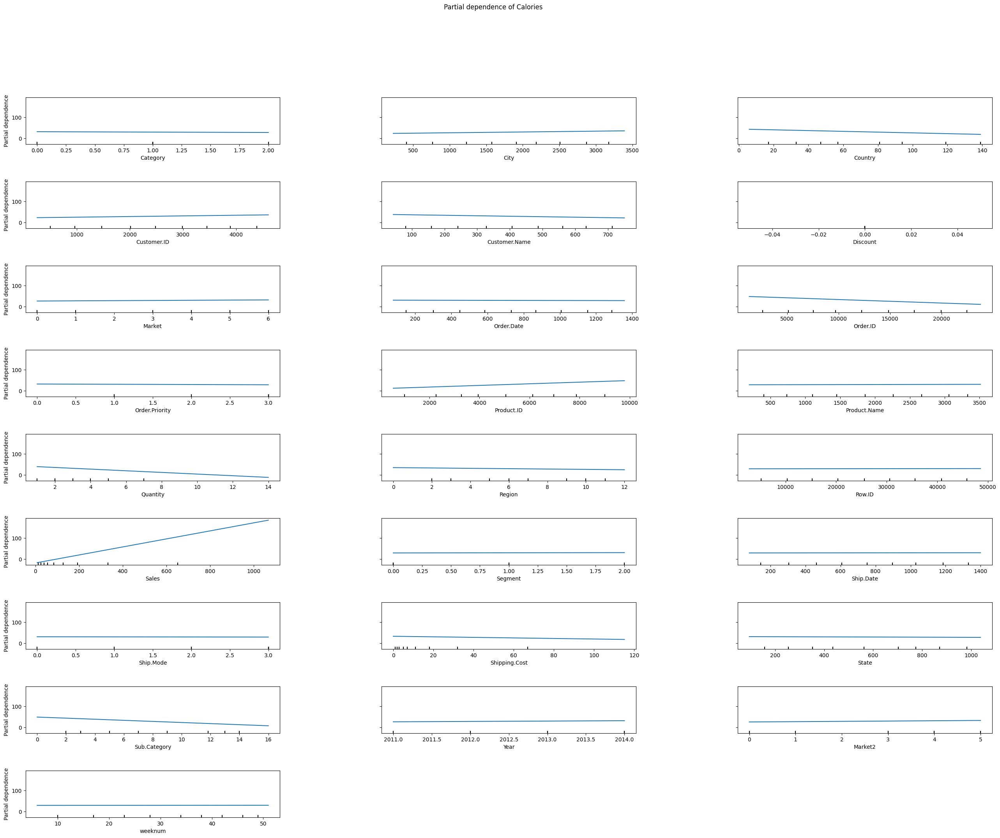

In [32]:
# PDP Plot for Linear Model
PartialDependenceDisplay.from_estimator(linear_model, x_test, x_test.columns, n_jobs=3, grid_resolution=20)

fig = plt.gcf()
fig.suptitle("Partial dependence of Calories")
fig.subplots_adjust(wspace=0.4, hspace=0.8)
plt.show()
plt.rcParams["figure.figsize"] = (32, 24)

### Tree Based Model

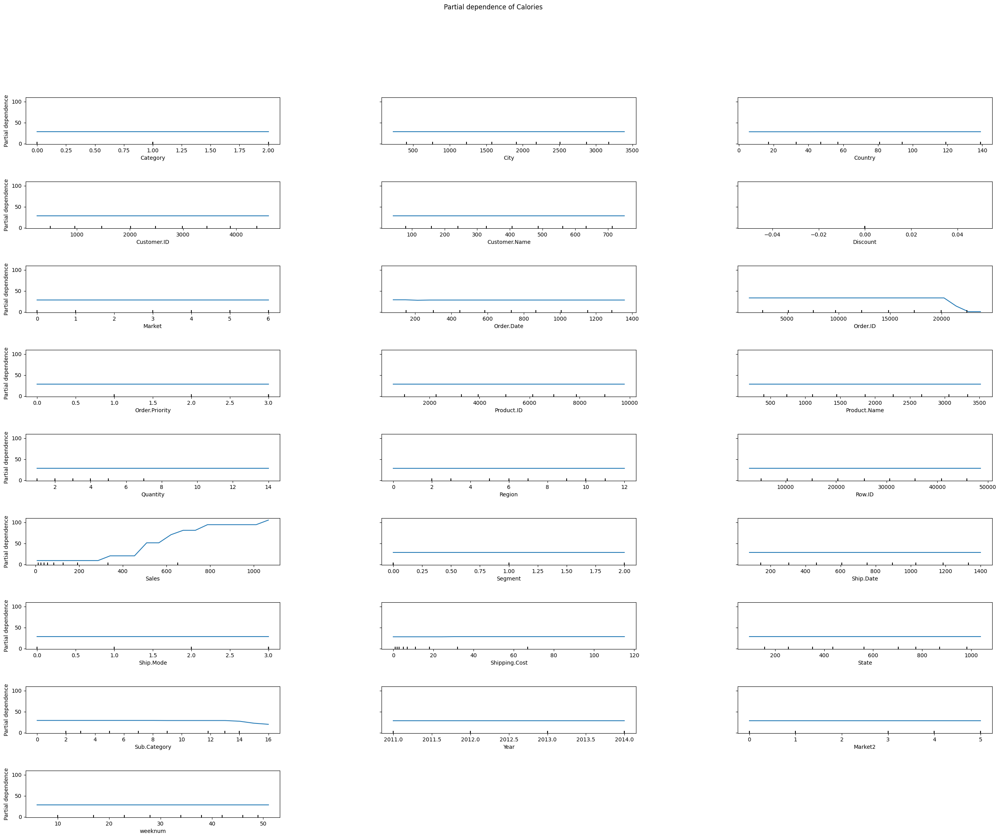

In [33]:
# PDP Plot for Tree based Model
PartialDependenceDisplay.from_estimator(tree_model, x_test, x_test.columns, n_jobs=3, grid_resolution=20)

fig = plt.gcf()
fig.suptitle("Partial dependence of Calories")
fig.subplots_adjust(wspace=0.4, hspace=0.8)
plt.show()
plt.rcParams["figure.figsize"] = (32, 24)

# SHAP Analysis

### Linear Model

In [55]:
# SHAP analysis of Linear Model
linear_explainer = shap.Explainer(linear_model.predict, x_train_100)
linear_shap_values = linear_explainer(x_train)

PermutationExplainer explainer: 46162it [37:41, 20.37it/s]                           


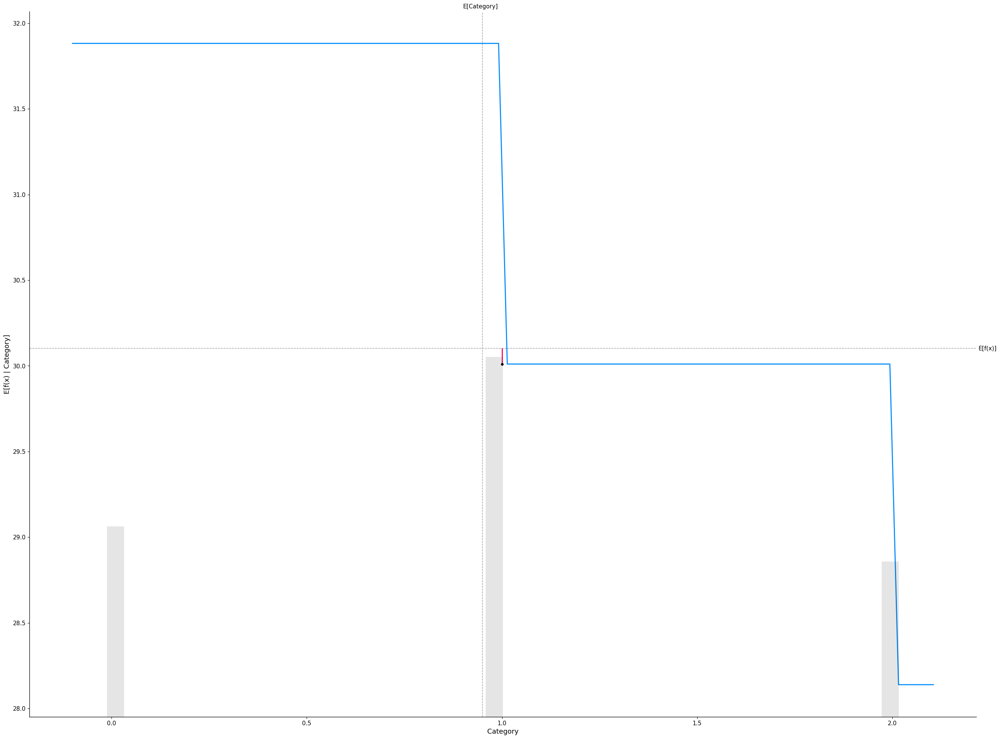

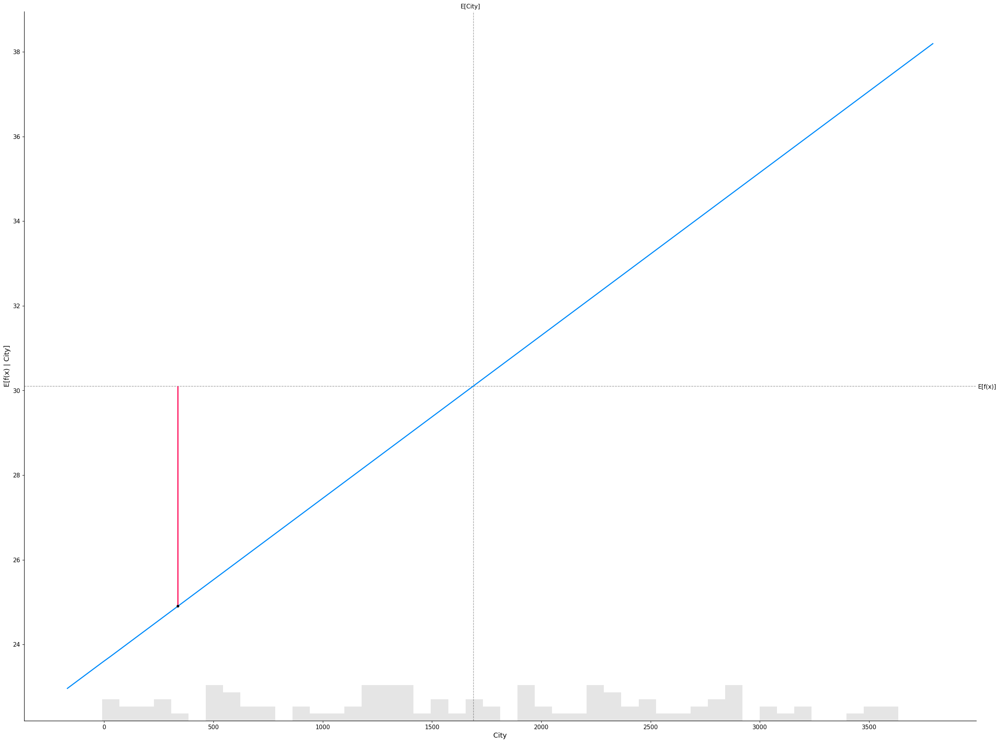

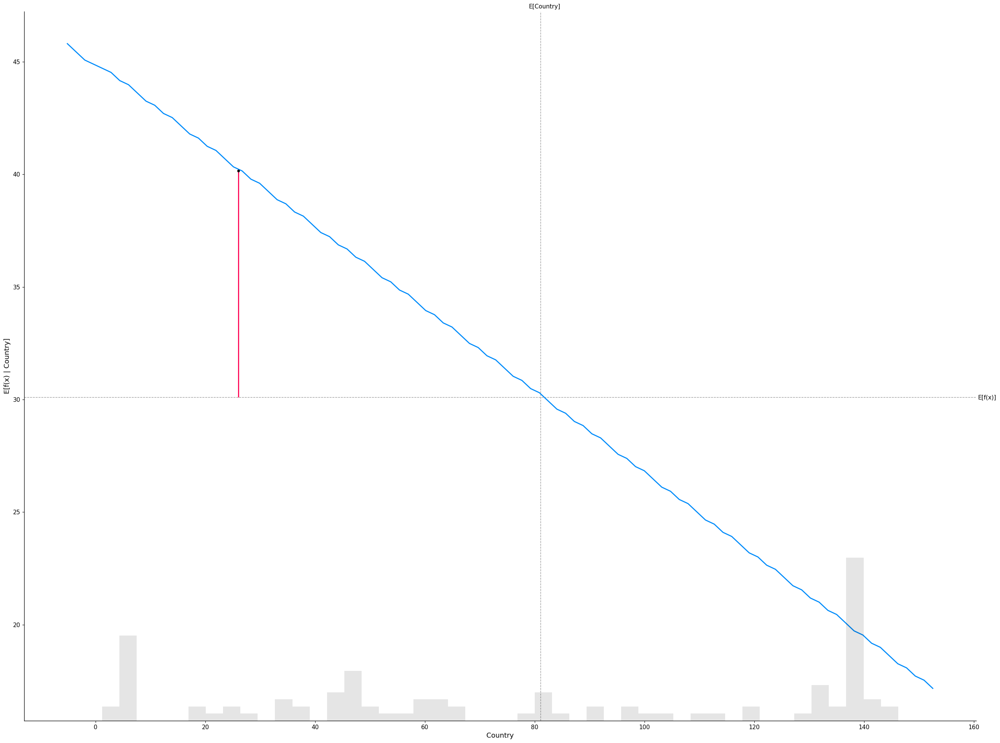

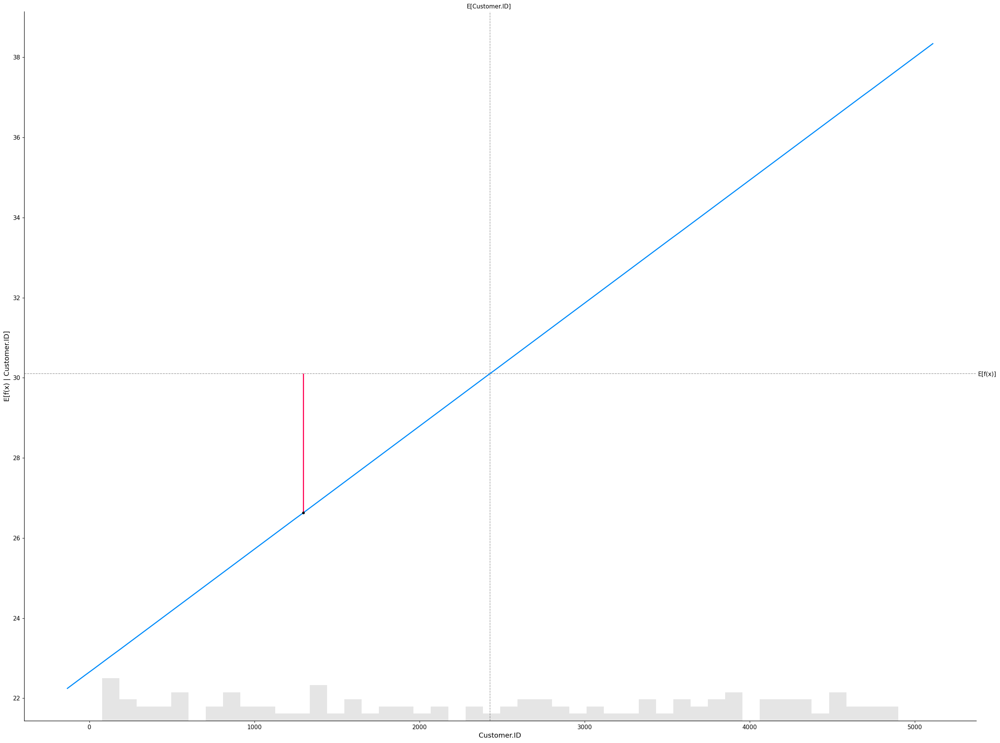

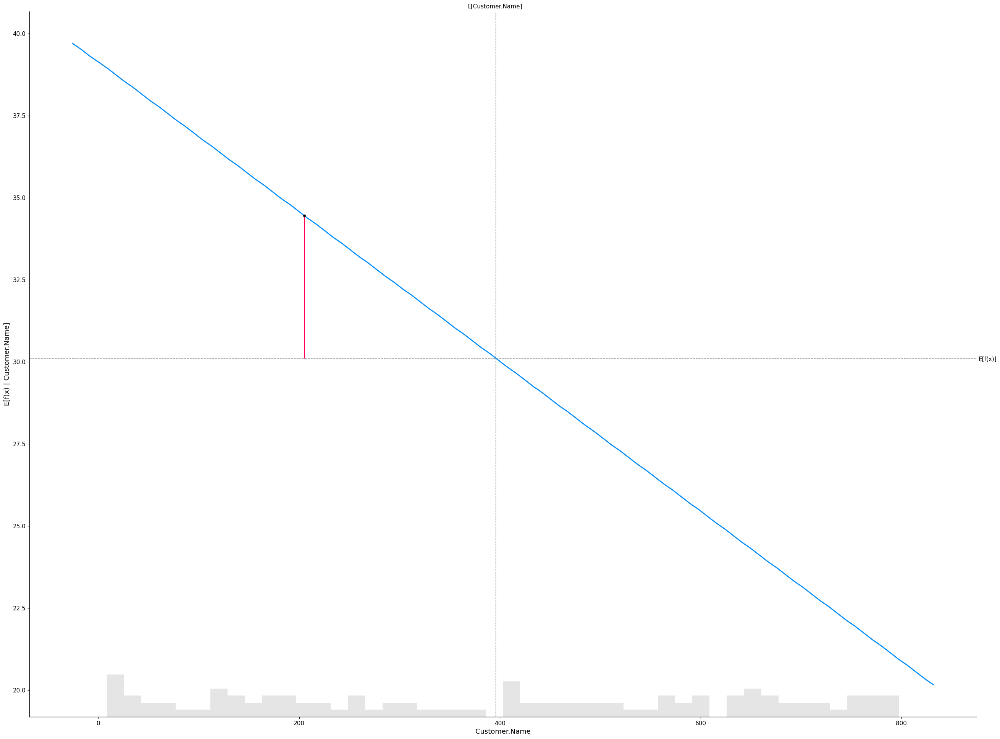

/usr/local/lib/python3.10/dist-packages/shap/plots/_partial_dependence.py:137: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax3.set_xlim(xmin,xmax)


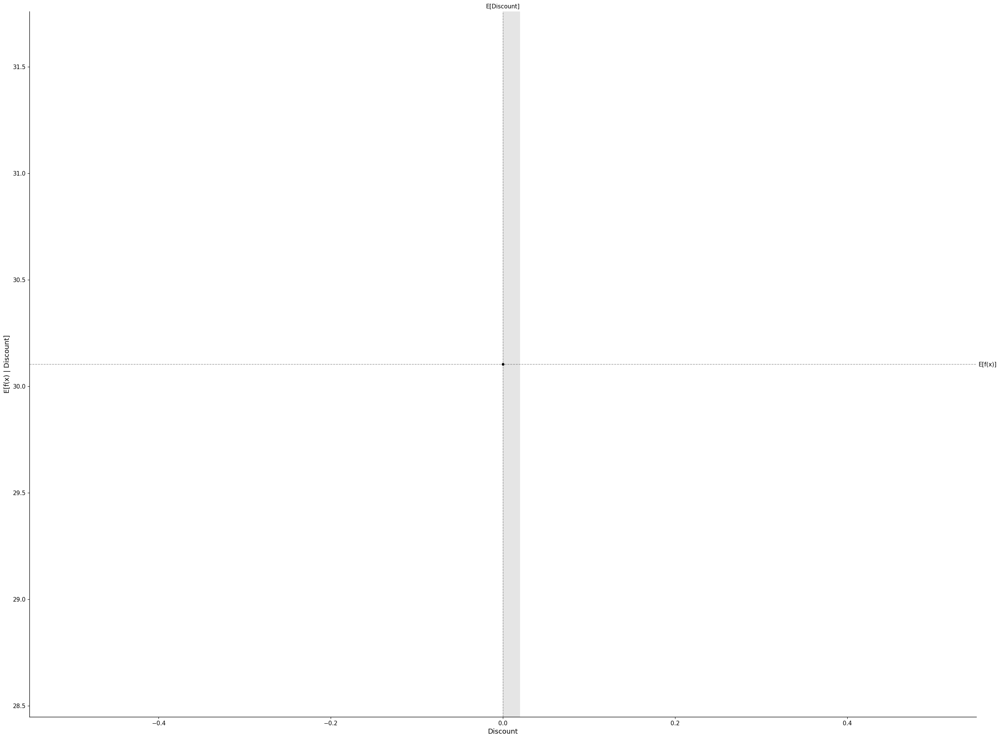

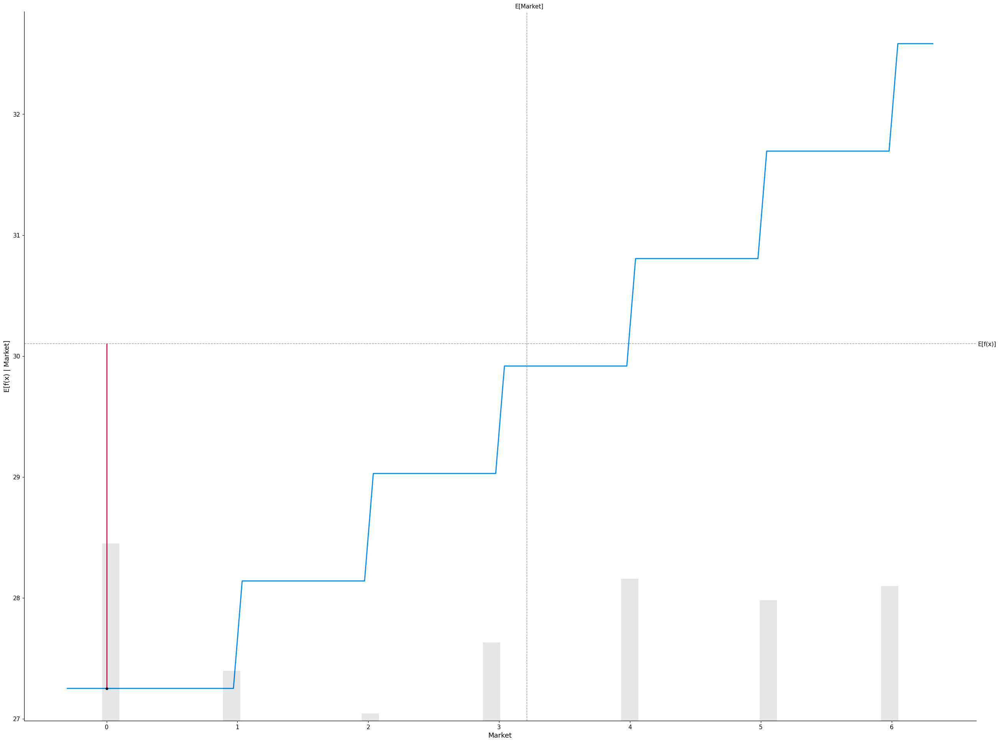

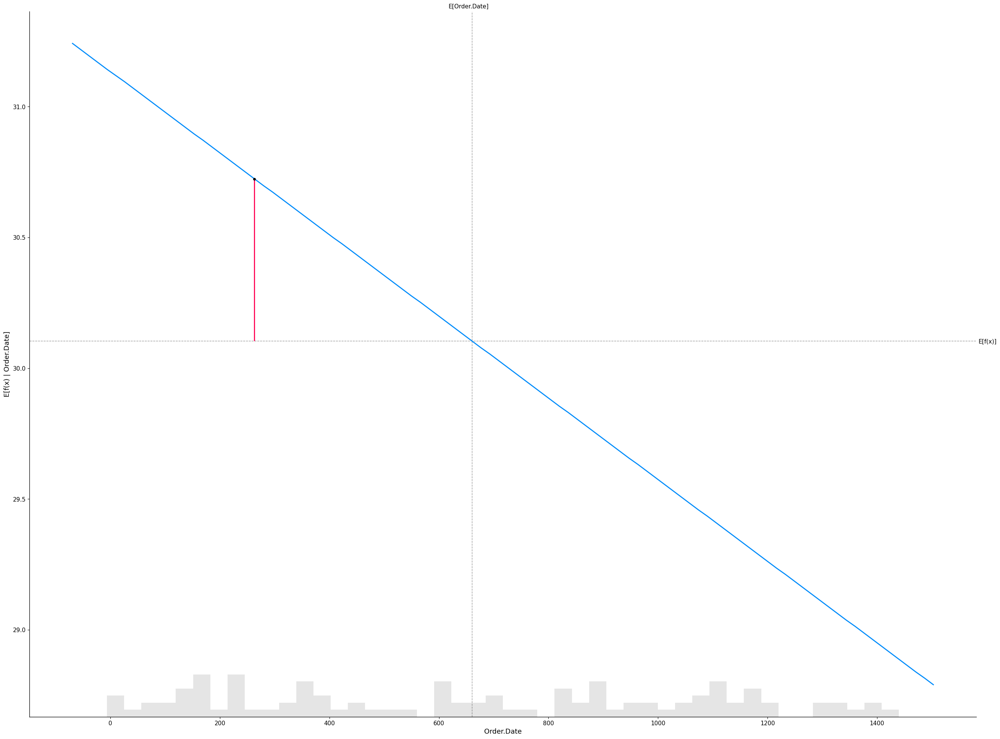

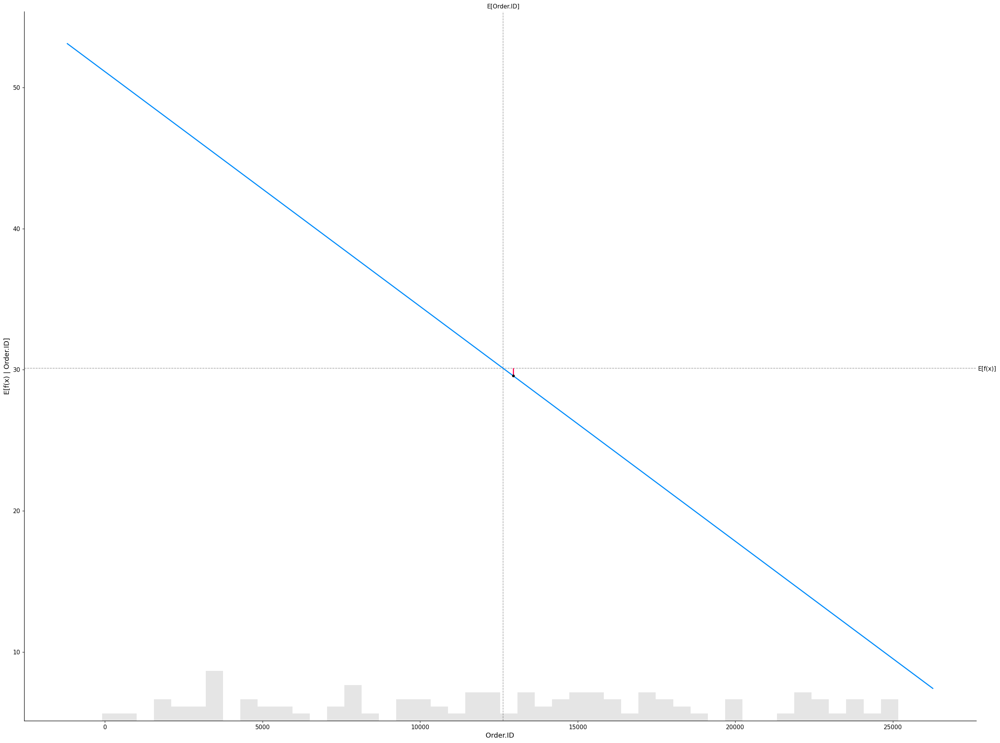

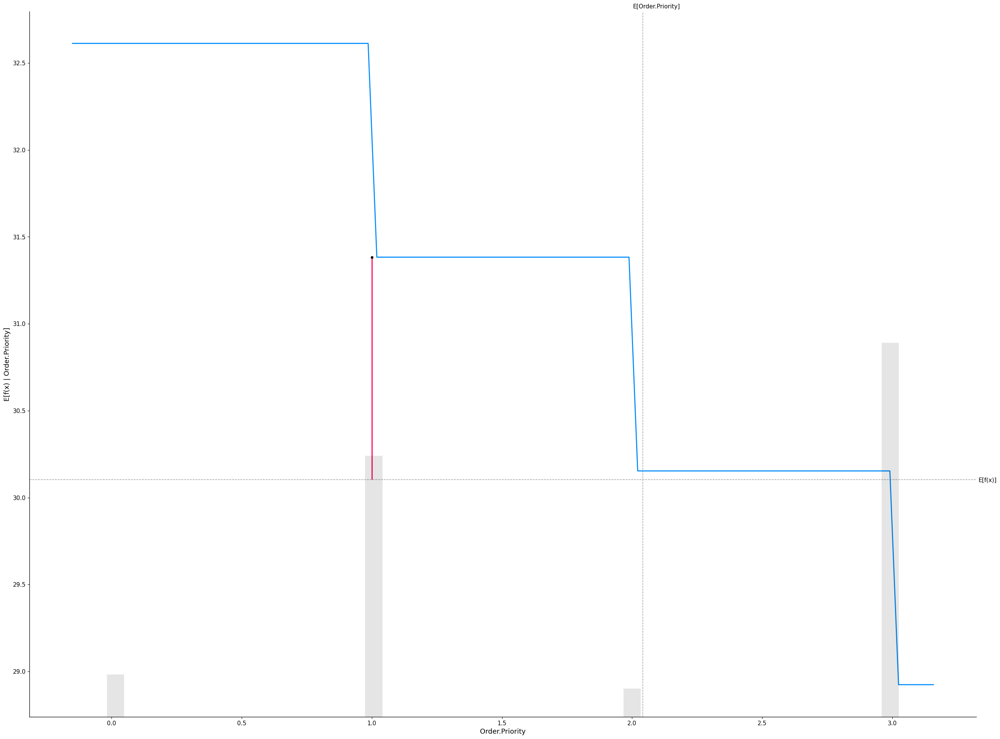

...

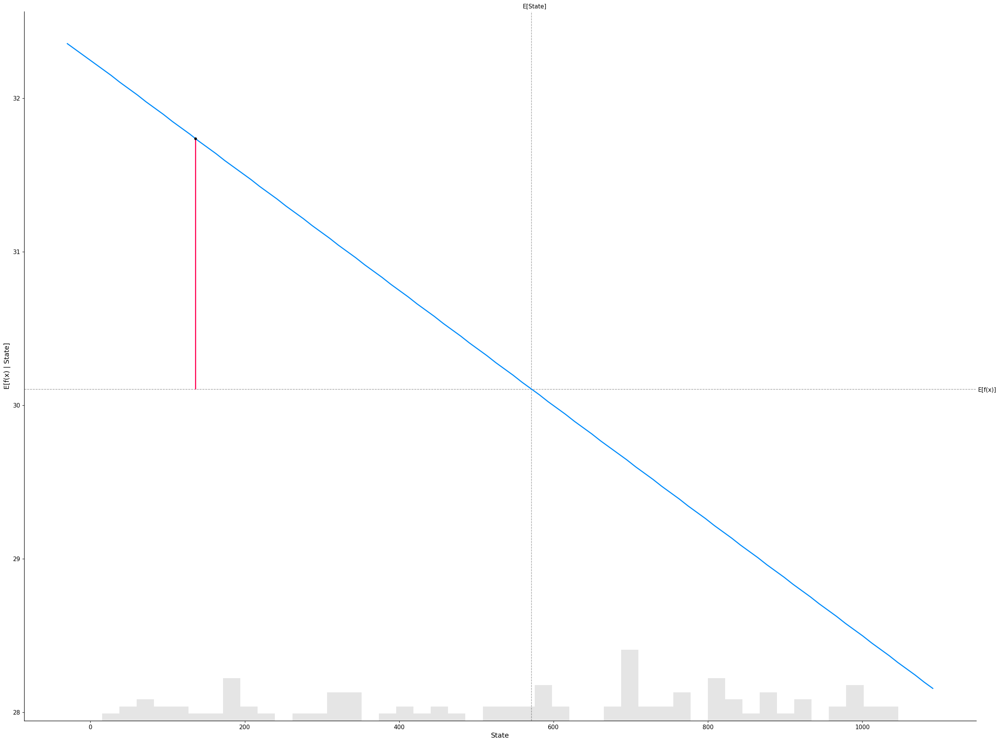

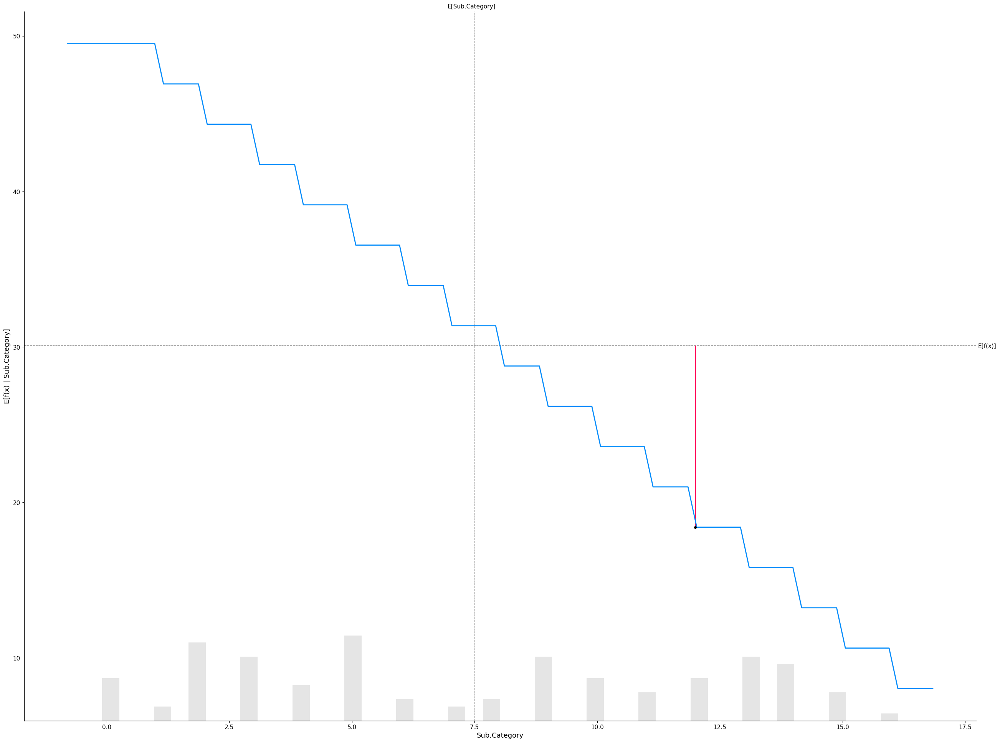

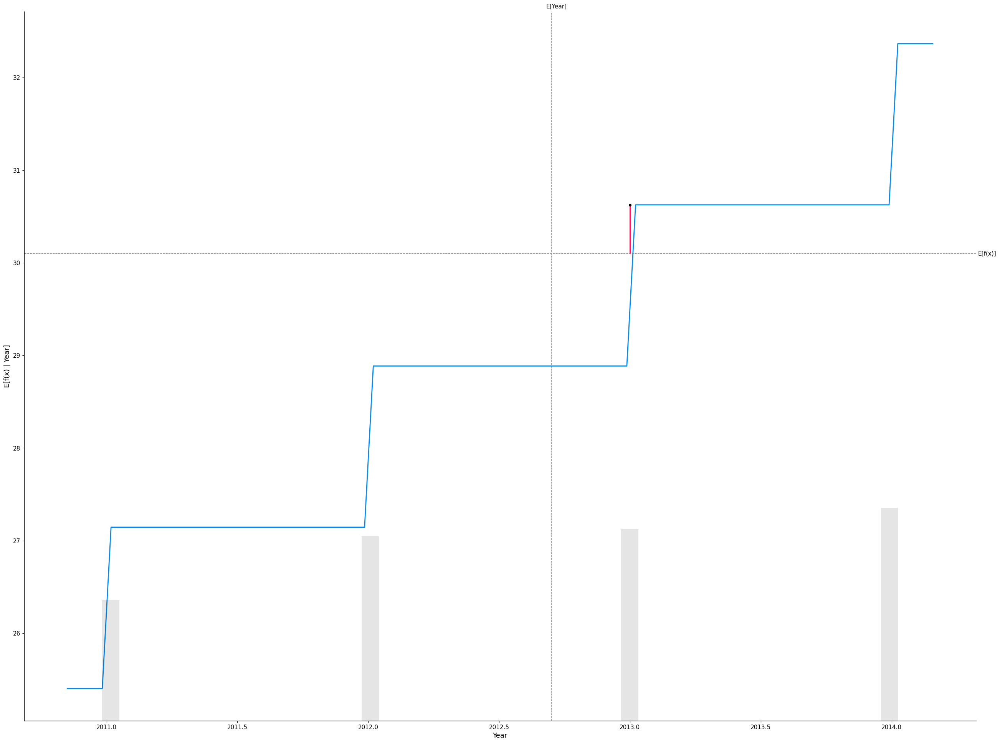

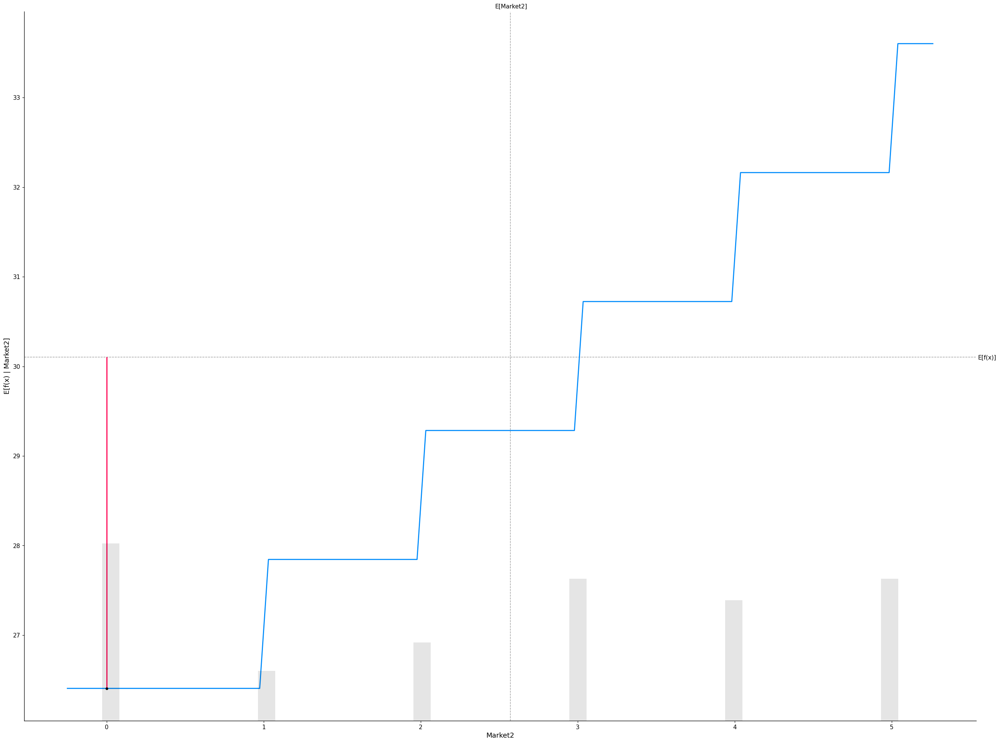

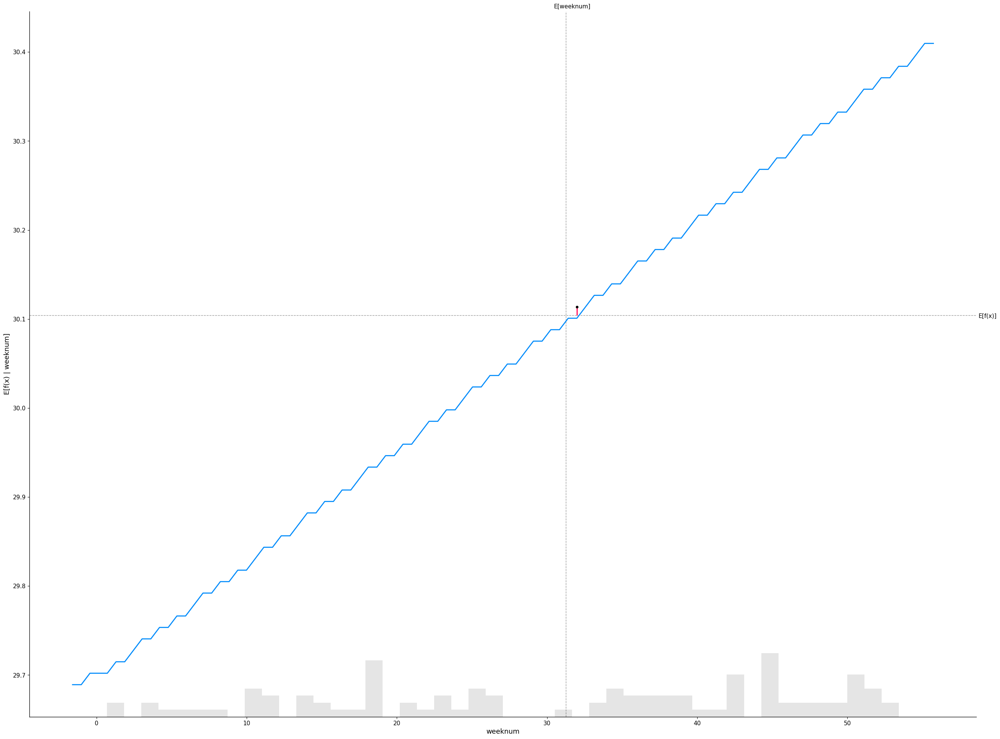

In [56]:
for i in x_train.columns:
     # Standard Partial Dependence Plot
     sample_ind = 18
     shap.partial_dependence_plot(
         i,
         linear_model.predict,
         x_train_100,
         model_expected_value=True,
         feature_expected_value=True,
         ice=False,
         shap_values=linear_shap_values[sample_ind : sample_ind+1, :],
    )

### Tree Based Model

In [57]:
# Shap analysis of a tree based model
tree_explainer = shap.Explainer(tree_model.predict, x_train_100)
tree_shap_values = tree_explainer(x_train)

PermutationExplainer explainer: 46162it [39:30, 19.38it/s]


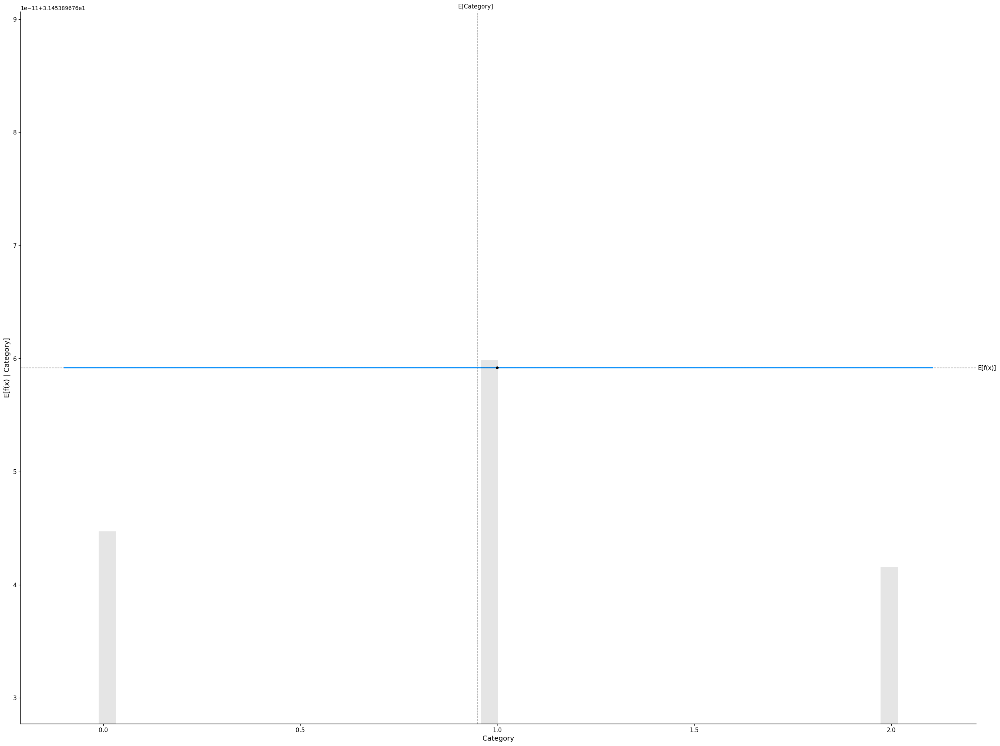

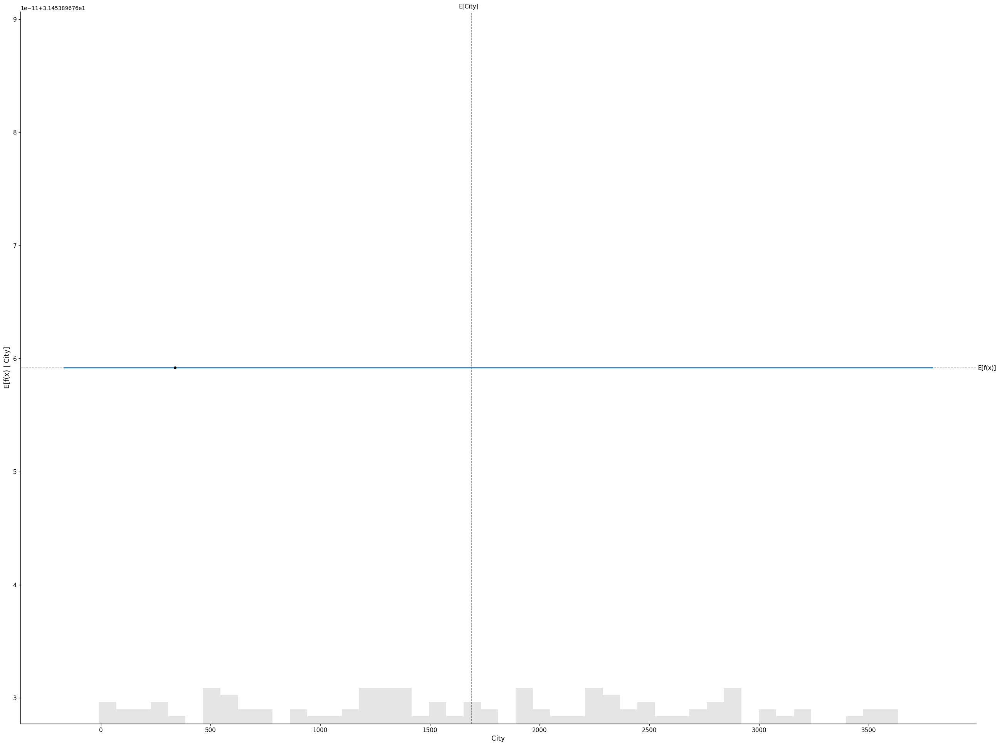

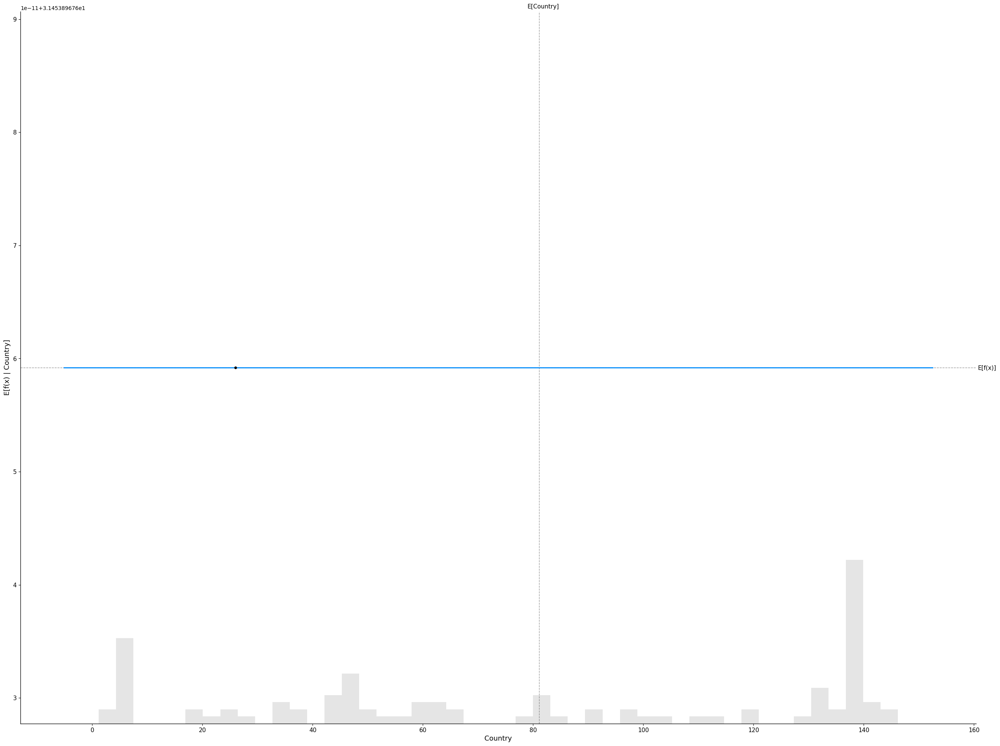

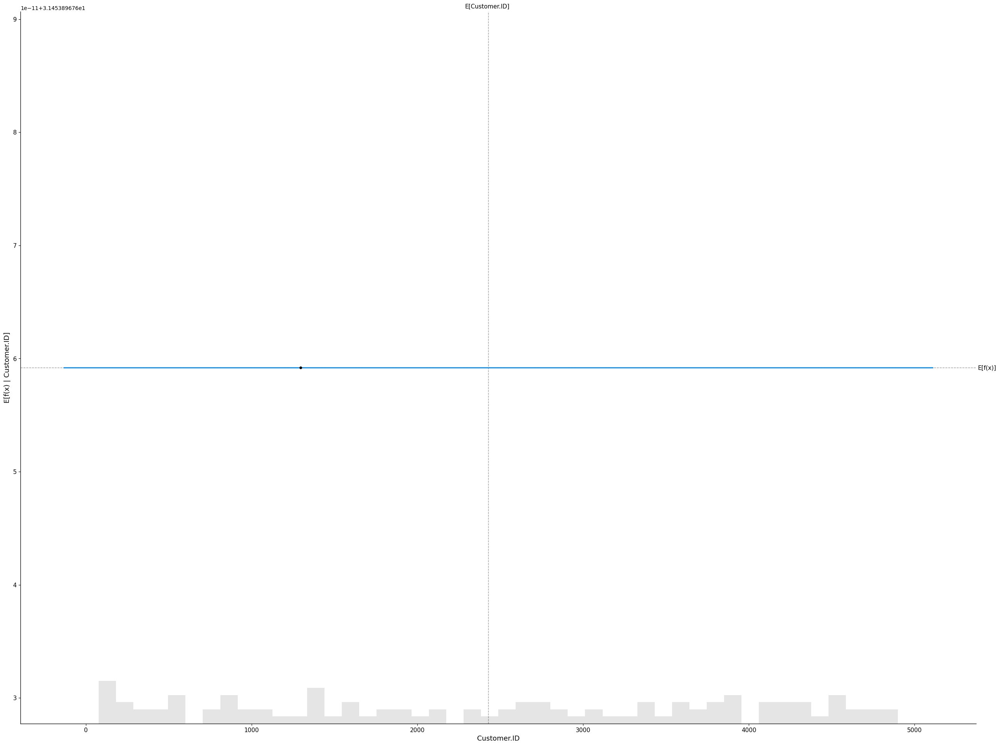

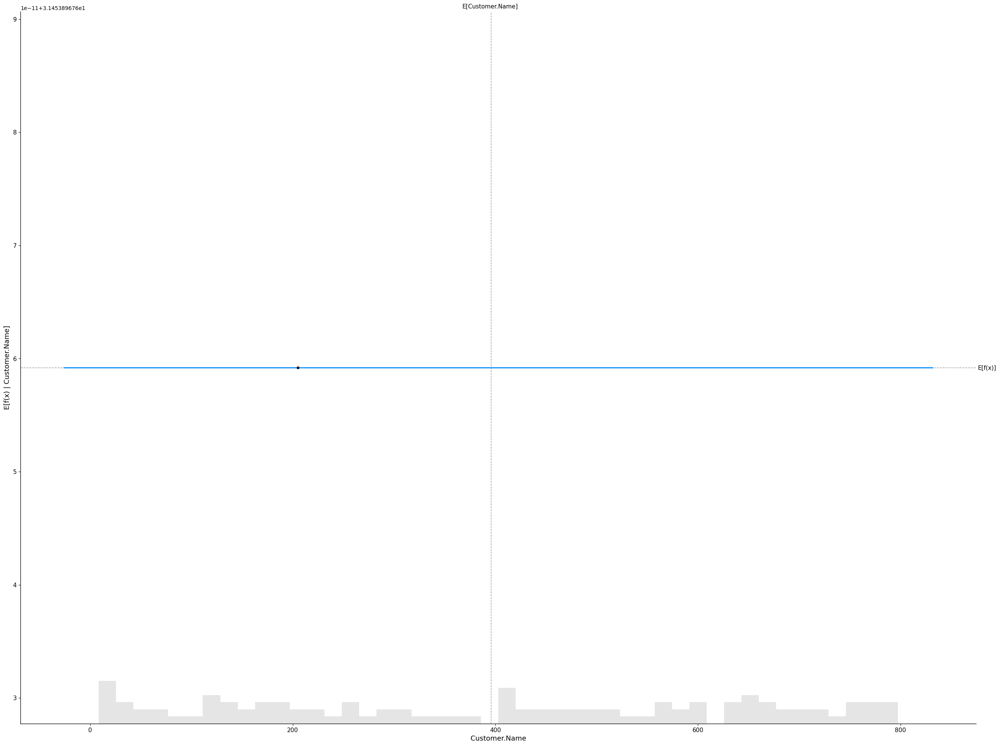

/usr/local/lib/python3.10/dist-packages/shap/plots/_partial_dependence.py:137: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax3.set_xlim(xmin,xmax)


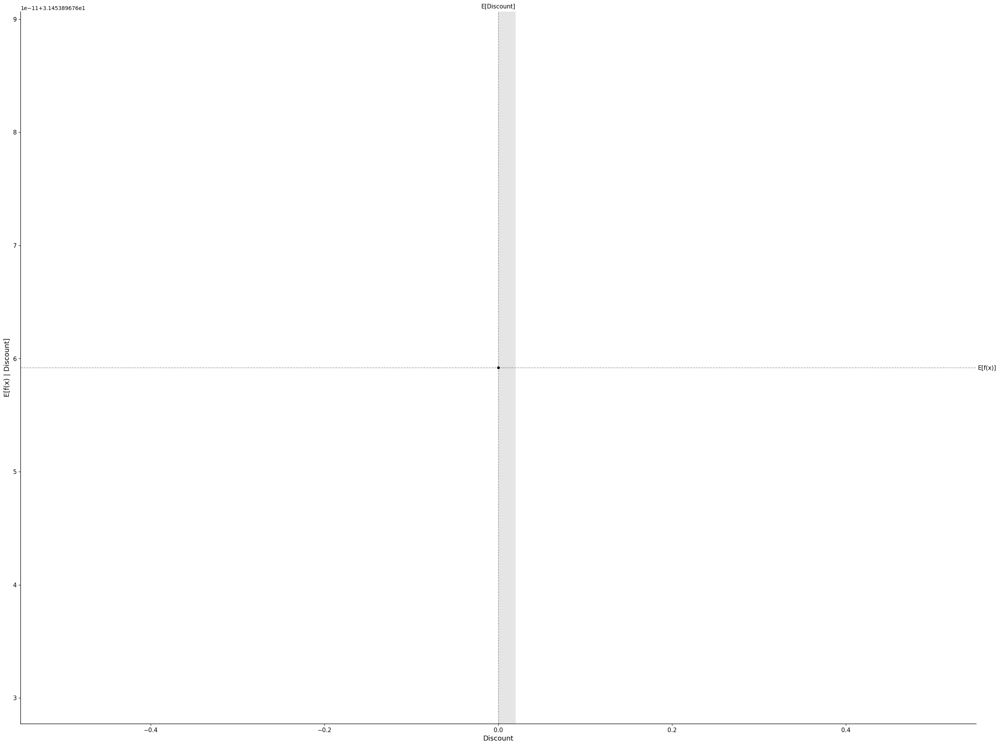

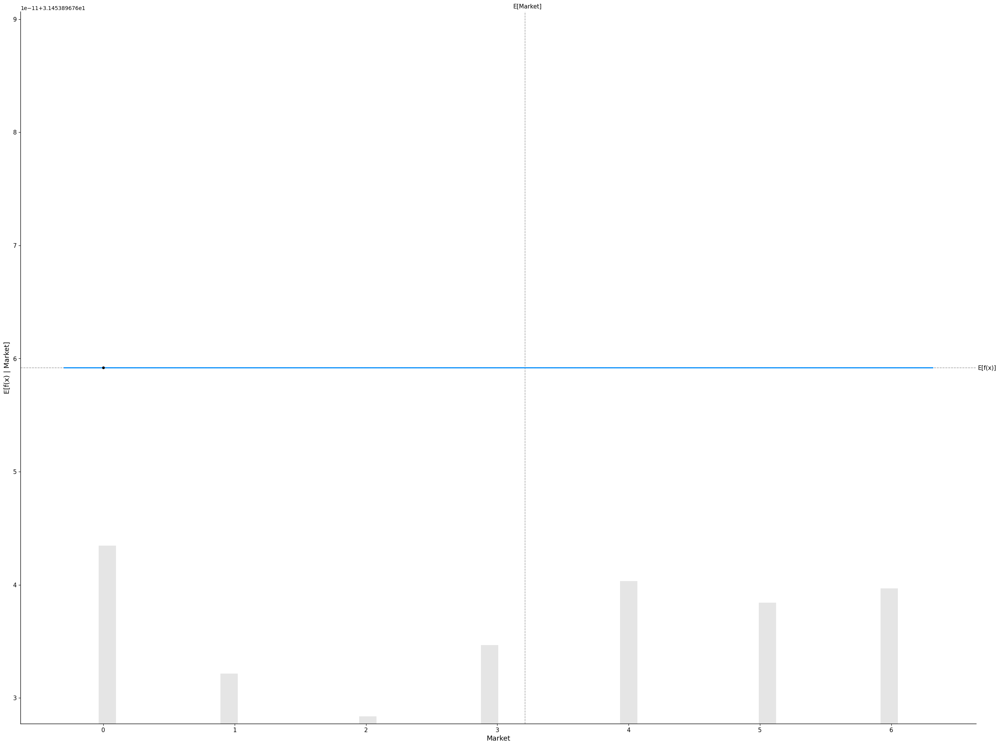

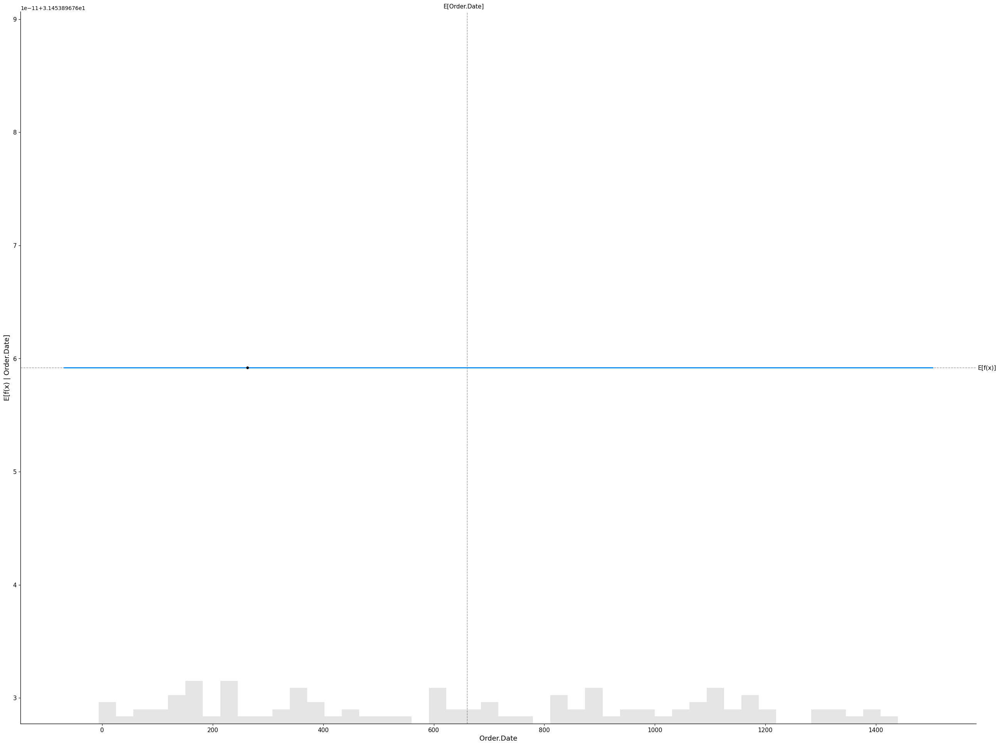

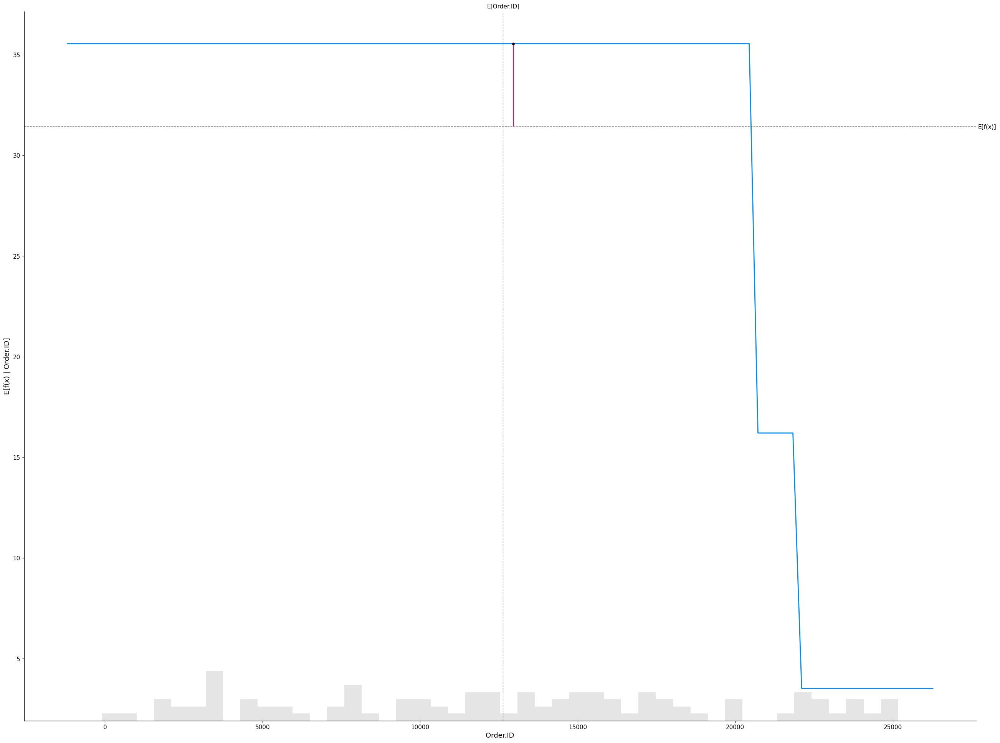

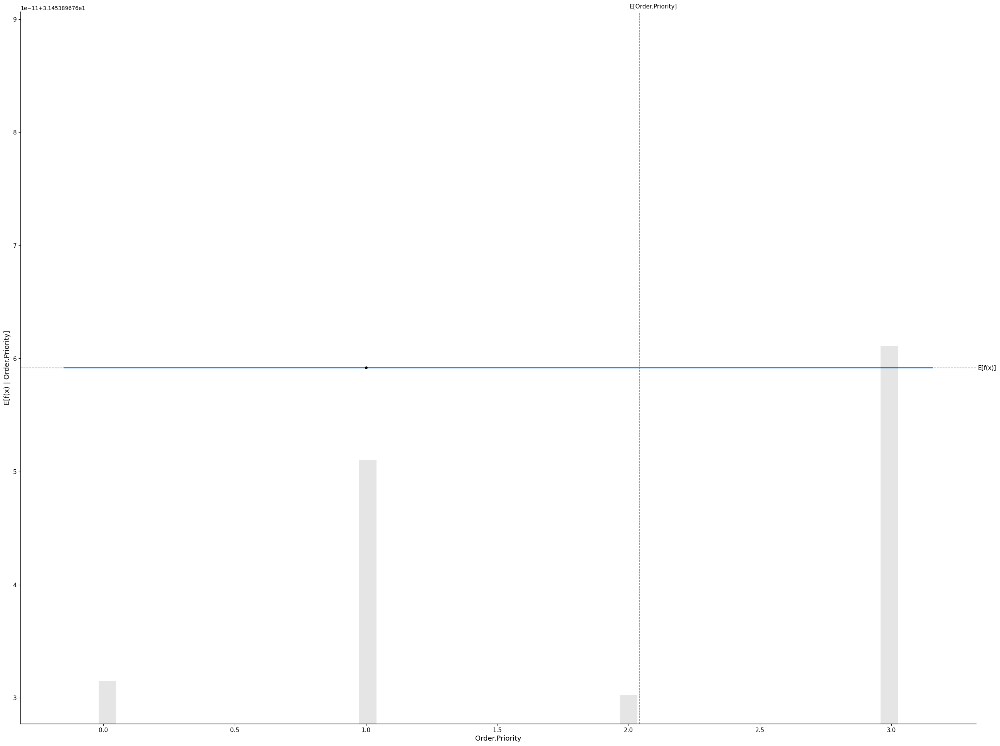

...

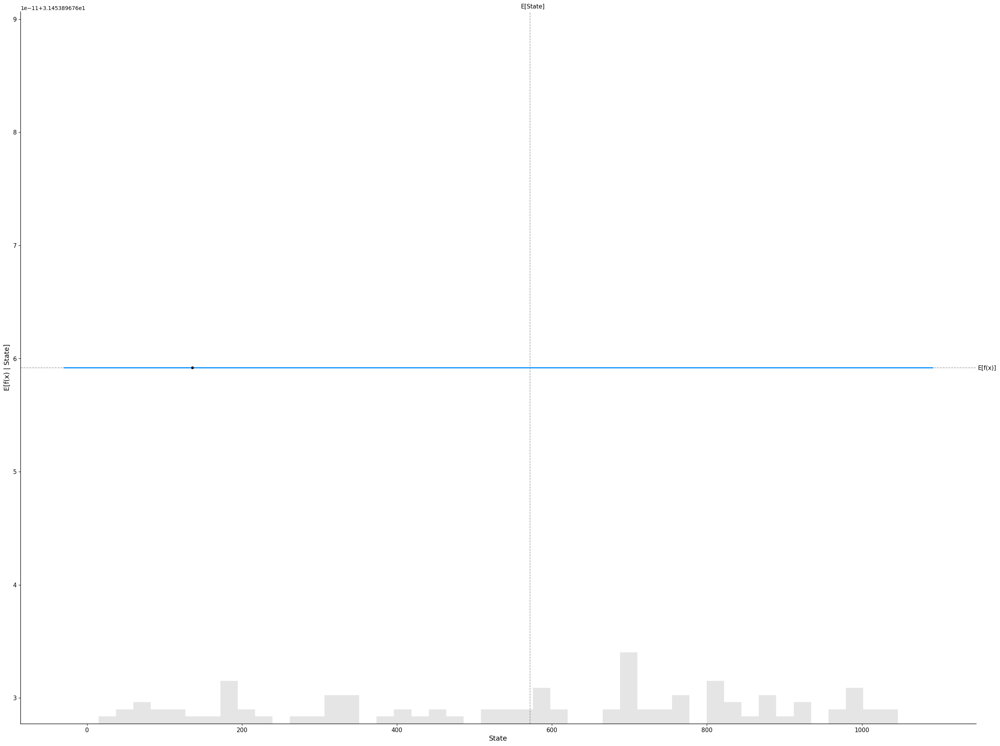

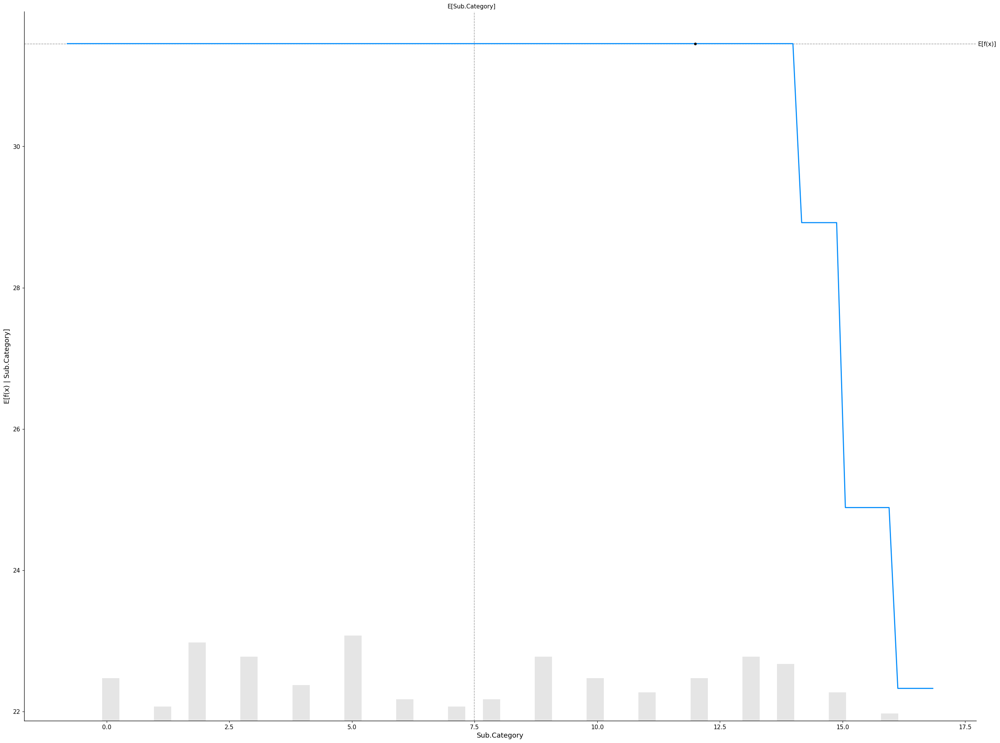

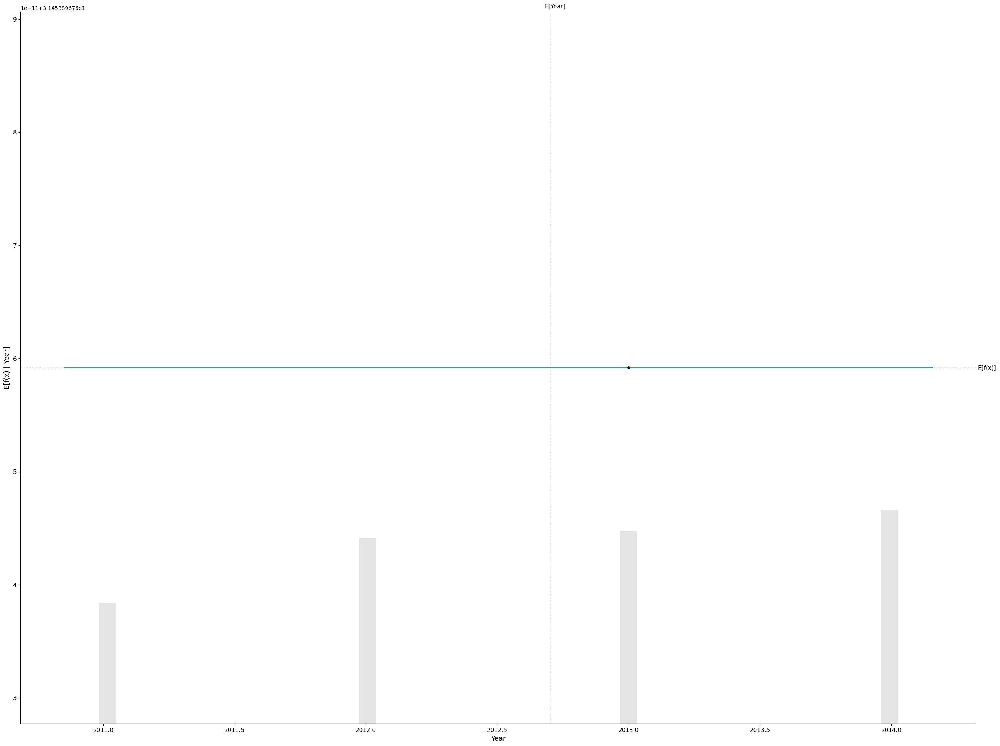

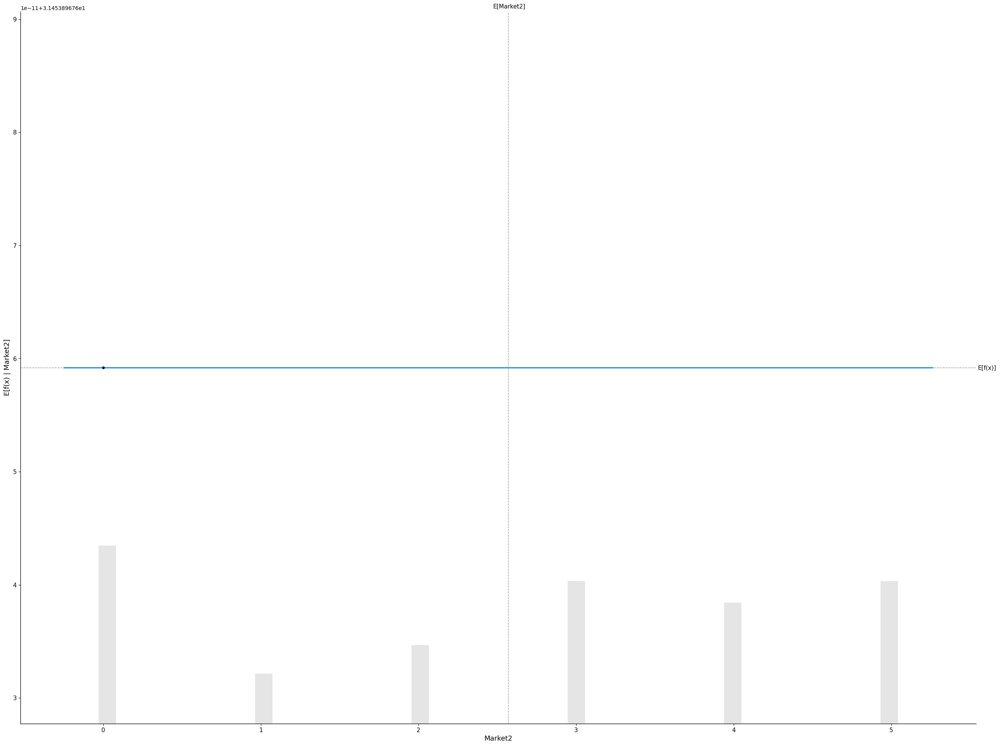

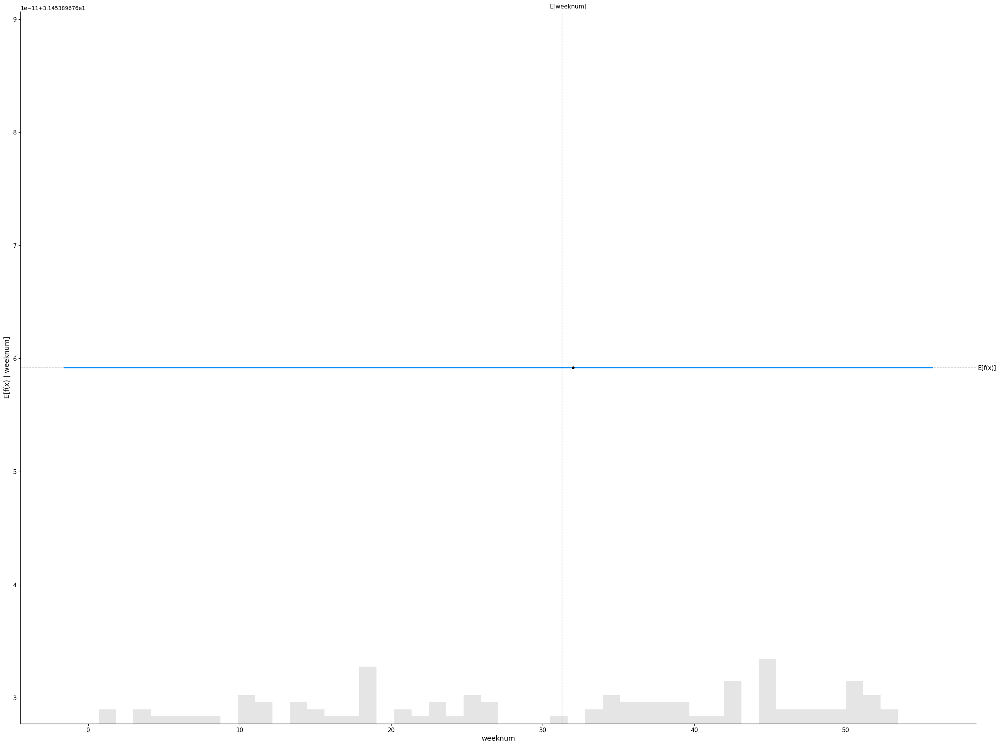

In [58]:
for i in x_train.columns:
     # Standard Partial Dependence Plot
     sample_ind = 18
     shap.partial_dependence_plot(
         i,
         tree_model.predict,
         x_train_100,
         model_expected_value=True,
         feature_expected_value=True,
         ice=False,
         shap_values=tree_shap_values[sample_ind : sample_ind+1, : ],
     )

# SHAP Feature Importance

### Linear Model

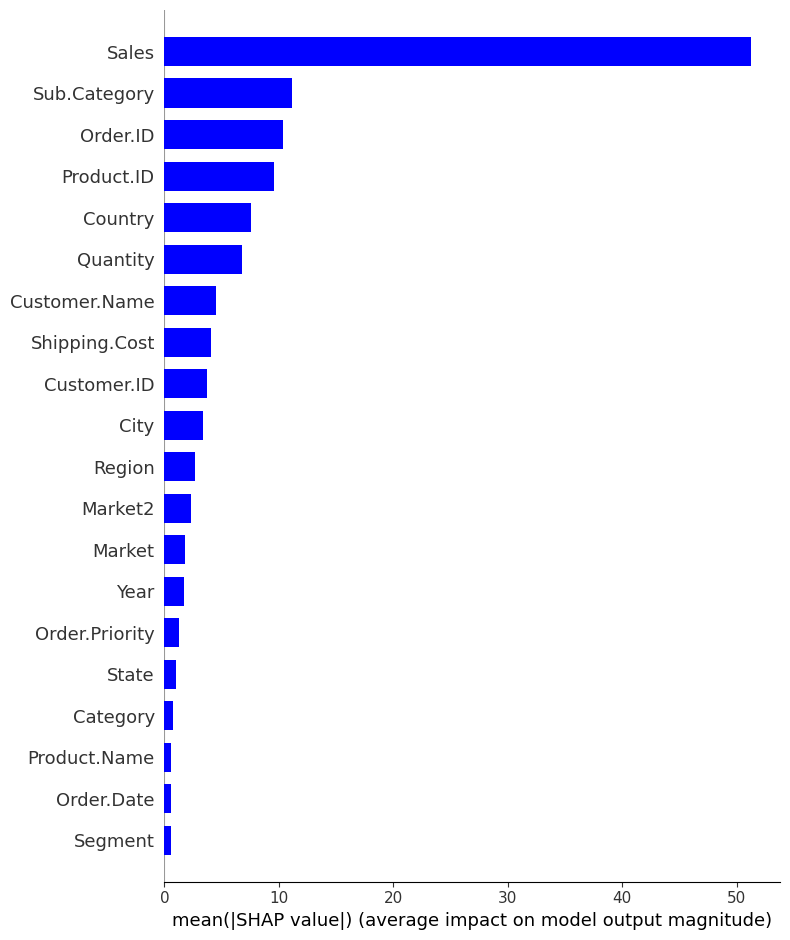

In [59]:
# SHAP variable importance for a Linear Model
shap.summary_plot(linear_shap_values, x_train, plot_type="bar", color="blue")

### Tree Based Model

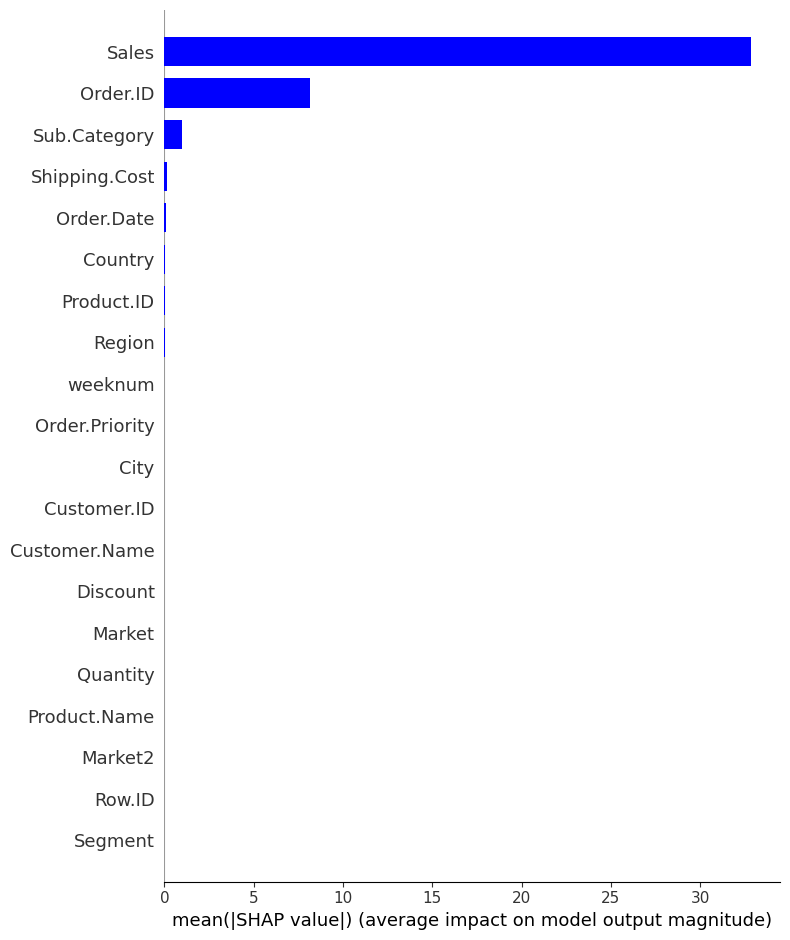

In [60]:
# SHAP variable importance for a Linear Model
shap.summary_plot(tree_shap_values, x_train, plot_type="bar", color="blue")

# Interpreting Waterfall SHAP Visualization

### Linear Model

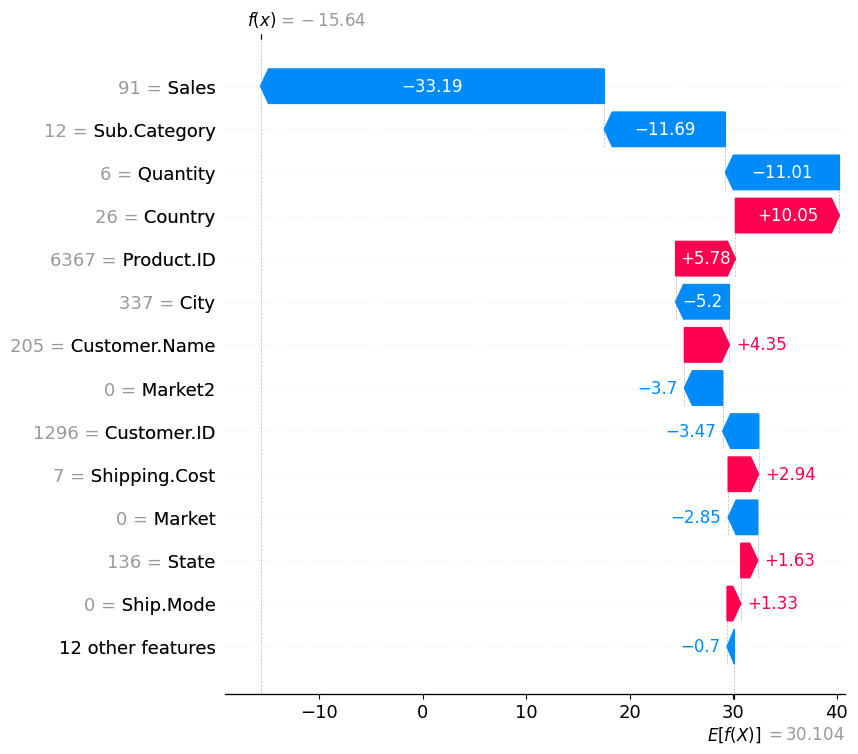

In [61]:
# Waterfall plot for linear model
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)

### Tree Based Model

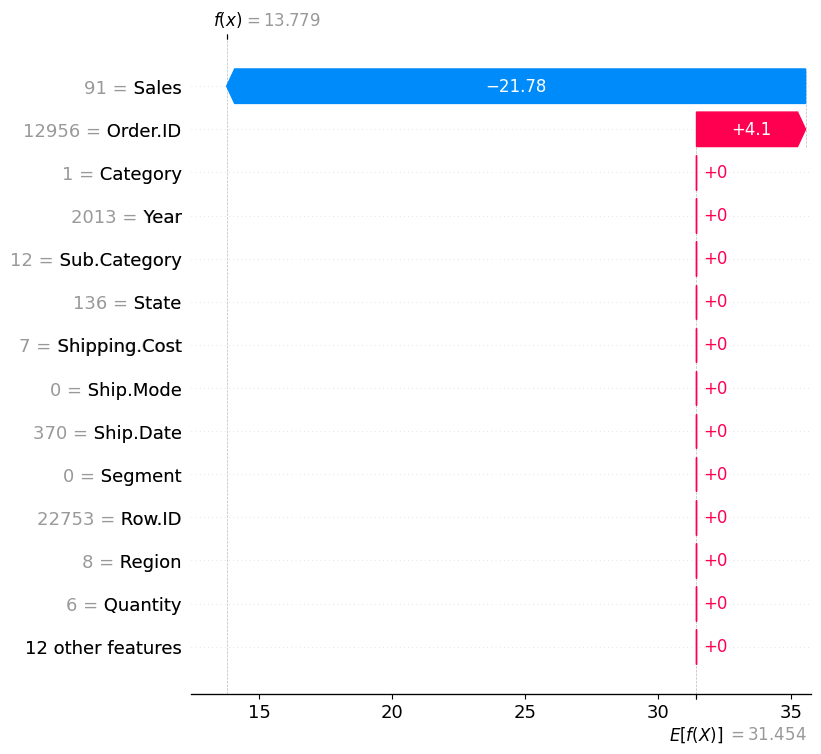

In [62]:
# Waterfall plot for Tree Based Model
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

# Summary Plot

### Linear Model

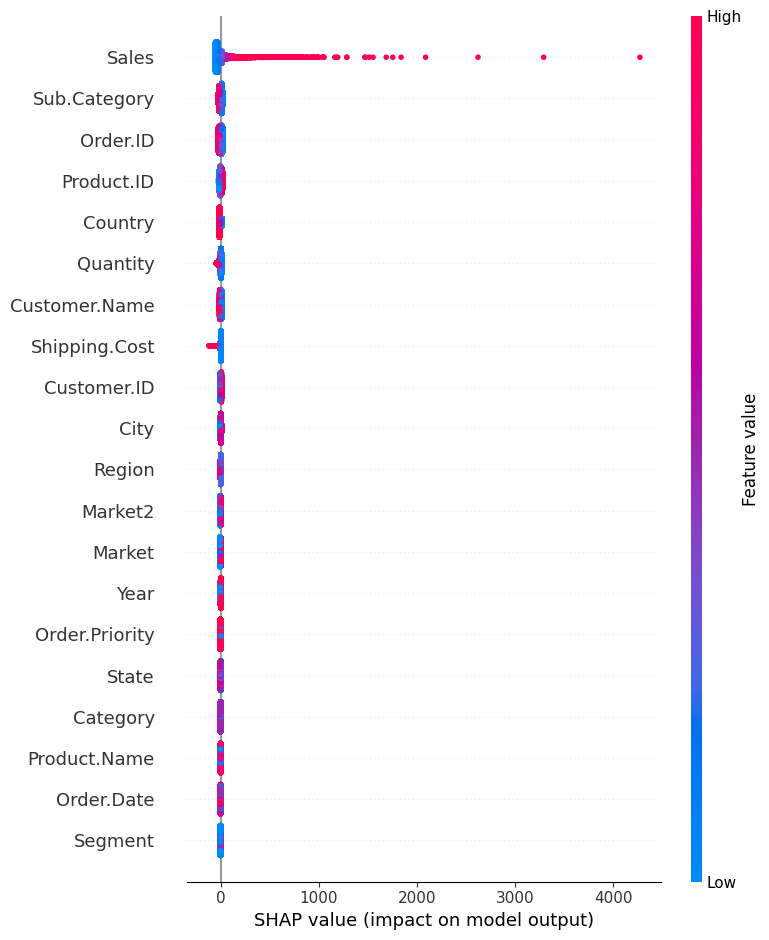

In [63]:
# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, x_train)

### Tree Based Model

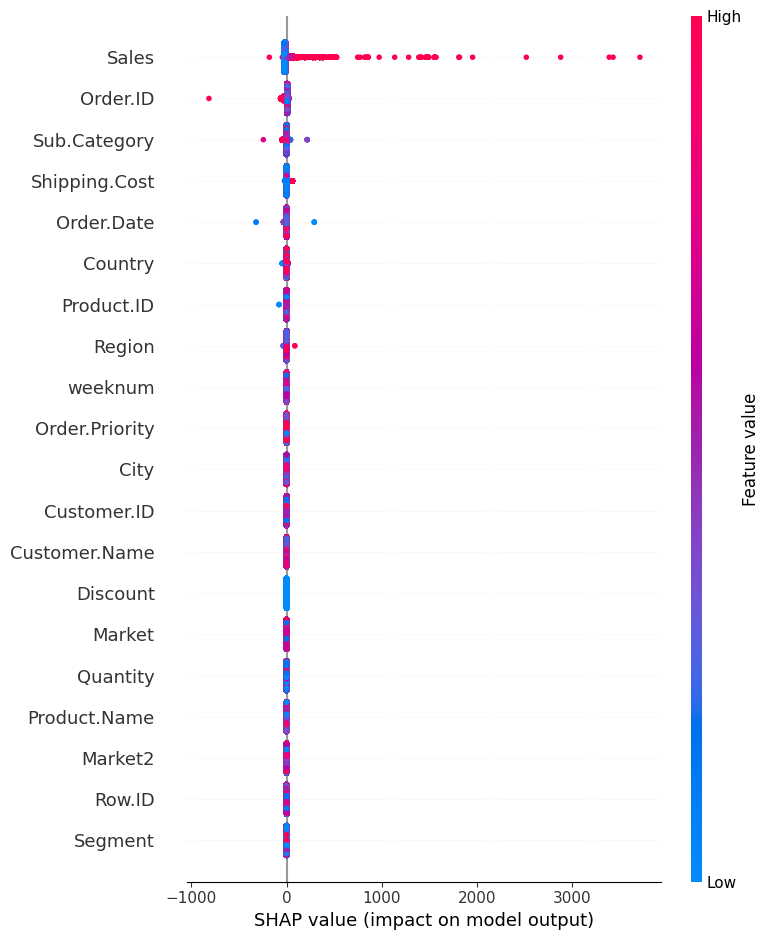

In [64]:
# SHAP summary for Tree Based Model
shap.summary_plot(tree_shap_values, x_train)

# SHAP Dependence Plot

### Linear Model

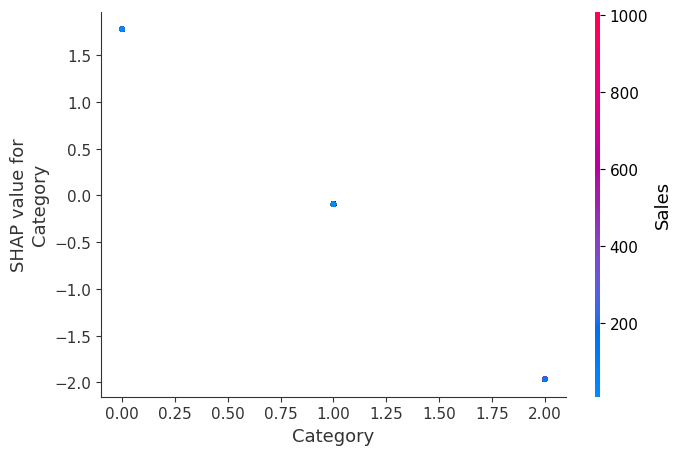

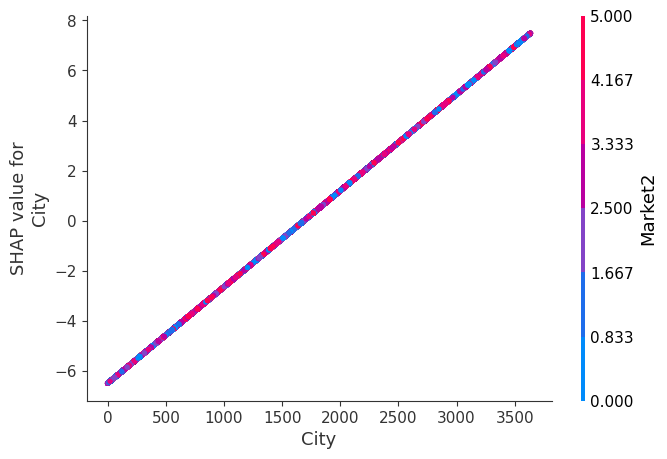

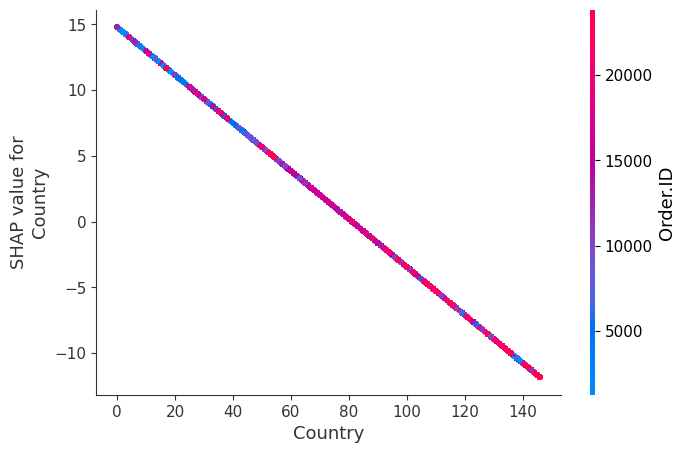

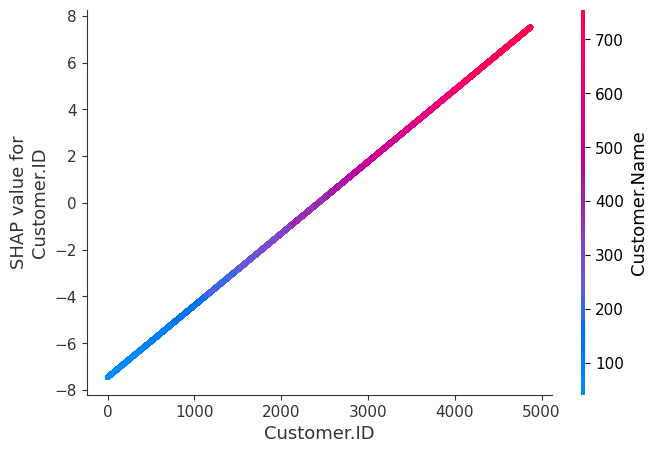

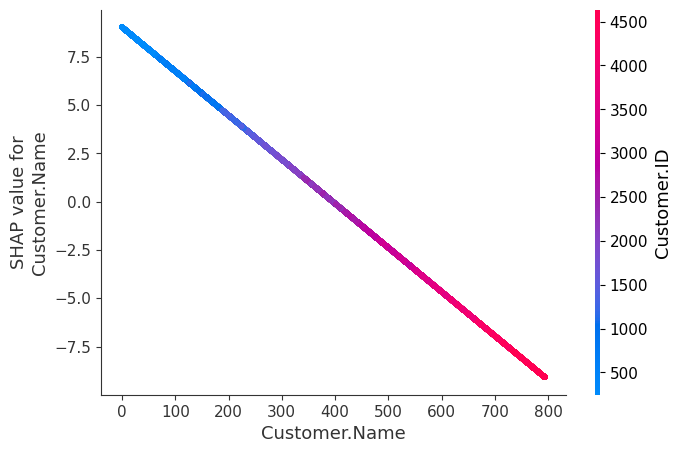

...

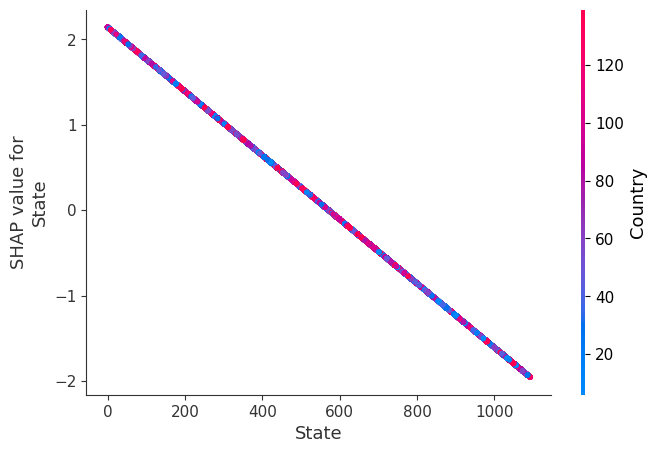

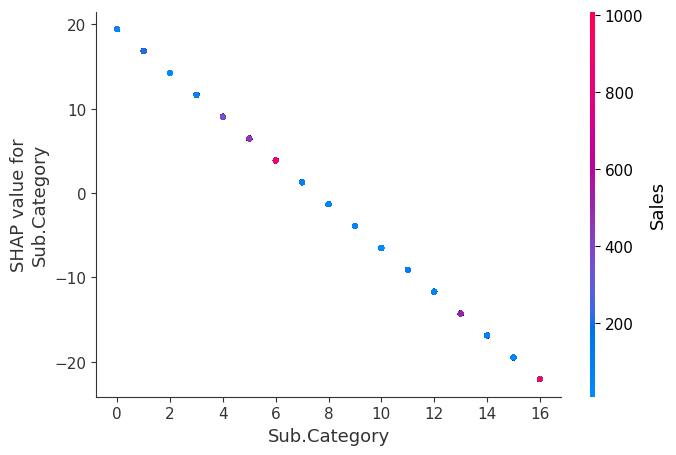

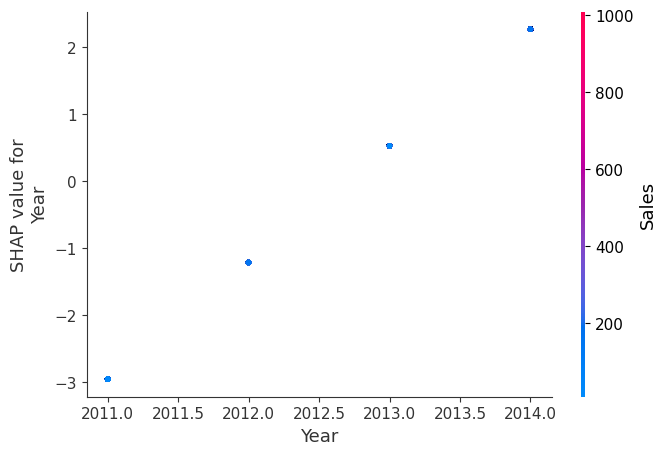

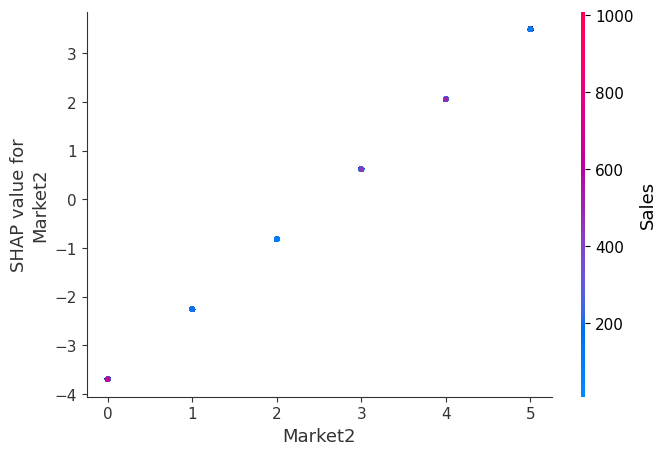

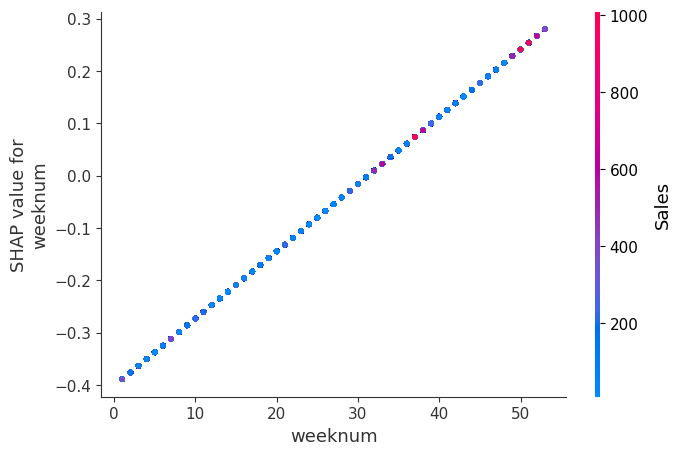

In [65]:
# SHAP partial dependence plot for linear model
for i in x_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, x_train)

### Tree Based Model

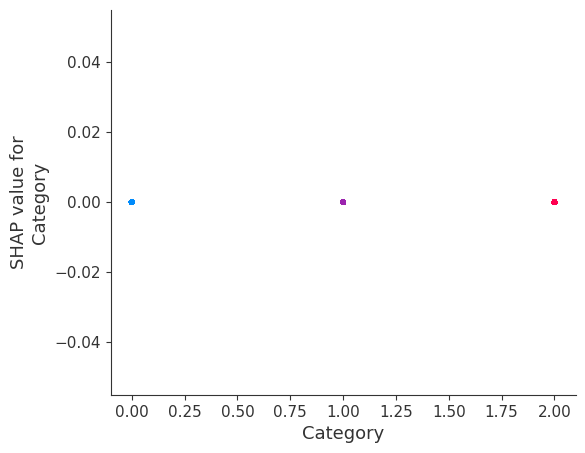

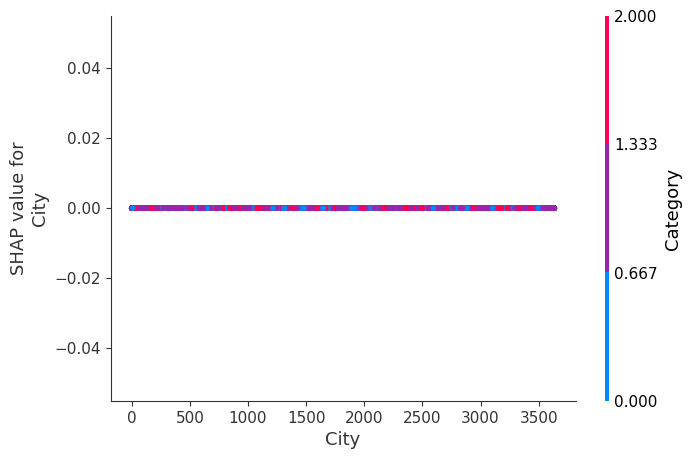

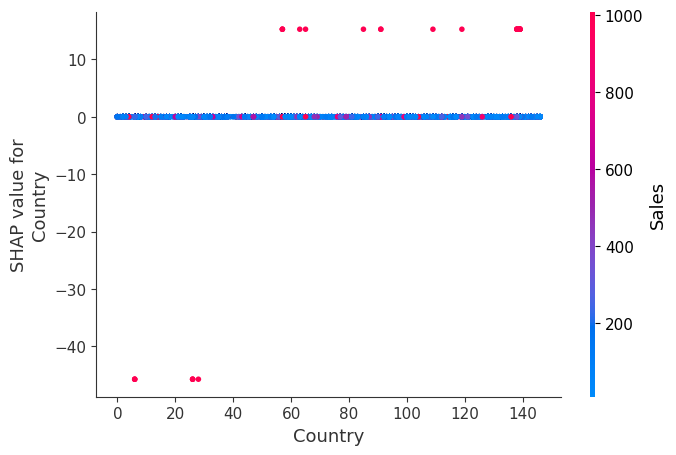

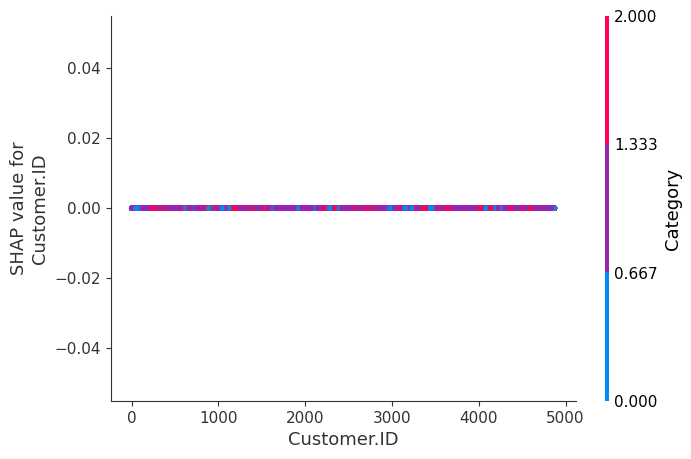

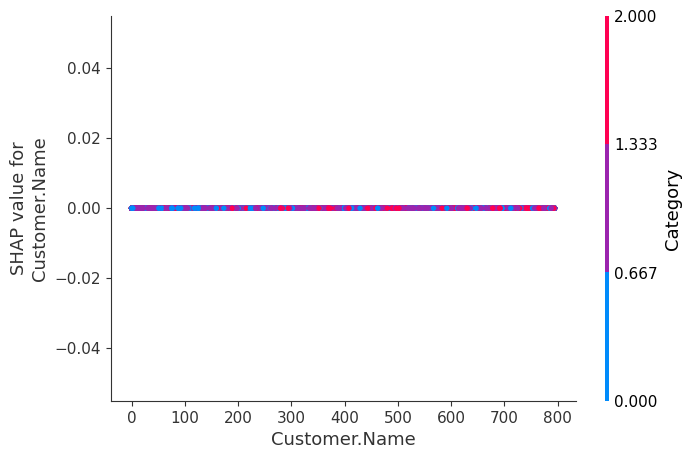

...

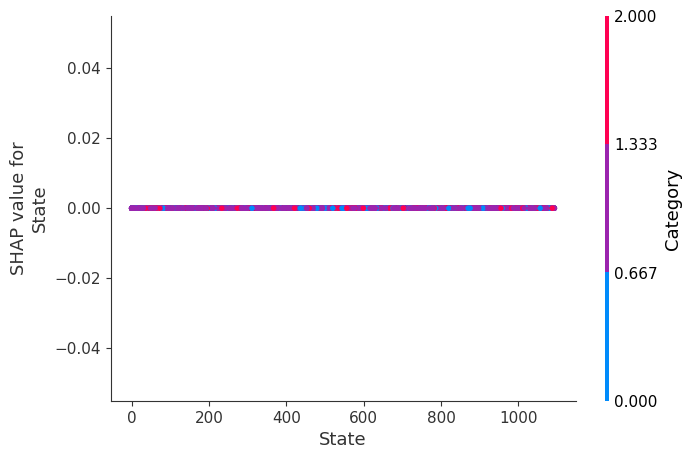

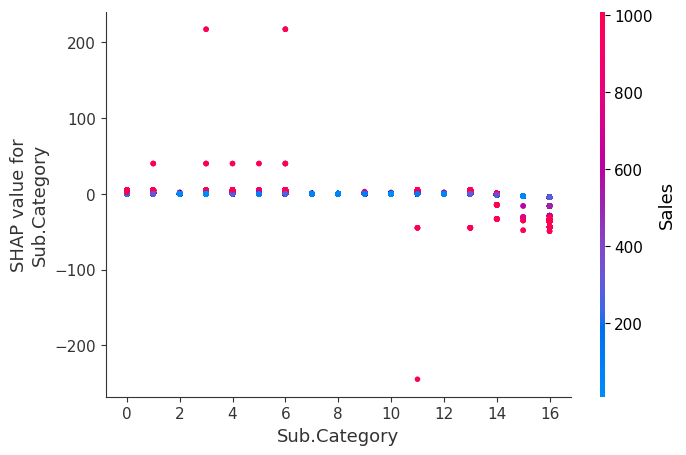

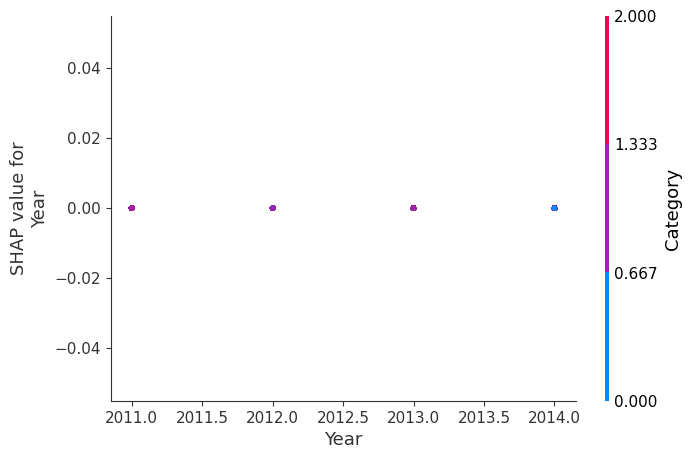

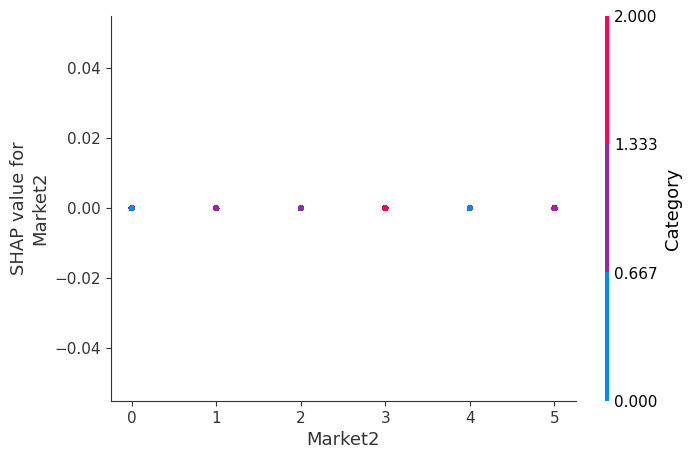

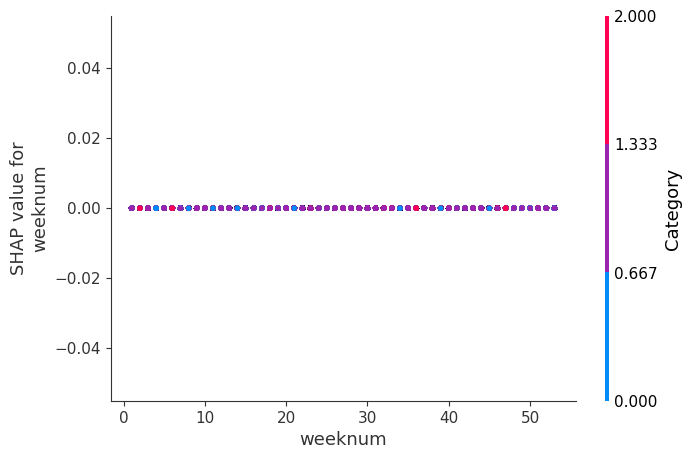

In [66]:
# SHAP partial dependence plot for tree based model
for i in x_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, x_train)

# References

1. OLS Model- http://net-informations.com/ds/mla/ols.html

2. Linear Regression- https://www.analyticsvidhya.com/blog/2021/05/all-you-need-to-know-about-your-first-machine-learning-model-linear-regression/

3. Linear Regression Assumptions- https://www.statisticssolutions.com/free-resources/directory-of-statistical-analyses/assumptions-of-linear-regression/

4. Professor's AutoML Notebook- https://github.com/nikbearbrown/AI_Research_Group/tree/main/Kaggle_Datasets/AutoML